#intro

The purpose here is to produce monitoring data with the same type of feature but add a sun transit signal in it.
That way we will be able to test our algorithm to find the sun.  

## comparison of several antennas

Here we are still looking at the antenna from the first EASIER hexagon (332-333-341-342-343-419)

In [2]:
%load_ext autoreload
%autoreload 2
#new way to load data
# the basic cuts are already in the select leaf
%matplotlib inline 
srcpwd = '/Users/romain/work/Auger/EASIER/LPSC/monitoring/script'
utilspath =srcpwd + '/utils/'
sys.path.append(utilspath)
import utils
classpath = srcpwd + '/classes/'
sys.path.append(classpath)
import dataset
#datafolder = '/Users/romain/work/Auger/EASIER/LPSC/monitoring/data/332_333/'
datafolder = '/Users/romain/work/Auger/EASIER/LPSC/monitoring/data/easier7/'
#fname = 'Antenna_2014-01-01_2014-01-30.root'
fname = 'Antenna_2014-01-01_2014-12-31.root'                                                                                                        
file = datafolder + fname

data = dataset.Dataset(file)
data.loaddata()
pfile = '/Users/romain/work/Auger/EASIER/LPSC/suntransit/data/period/controlperiod_Tsys_50K_below_2adc.txt'
data.loadperiod(pfile)                                                                                                                              

Welcome to ROOTaaS 6.06/00


In [114]:
data332 = data.getnewdatawithid(332)
data332.selectleafs()
data333 = data.getnewdatawithid(333)
data333.selectleafs()

### a look at the shape of the baseline evolution on different time scales

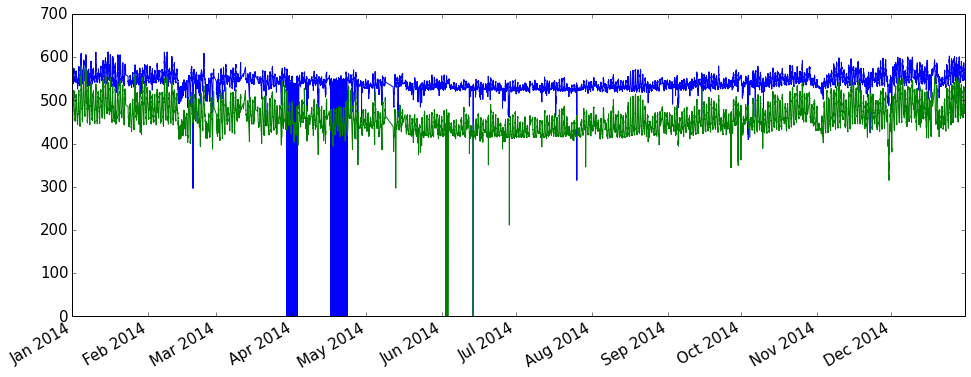

In [115]:
fig = plt.figure(figsize=(16,6))
plt.plot(data332.date,data332.radio)
plt.plot(data333.date,data333.radio)
plt.gcf().autofmt_xdate()

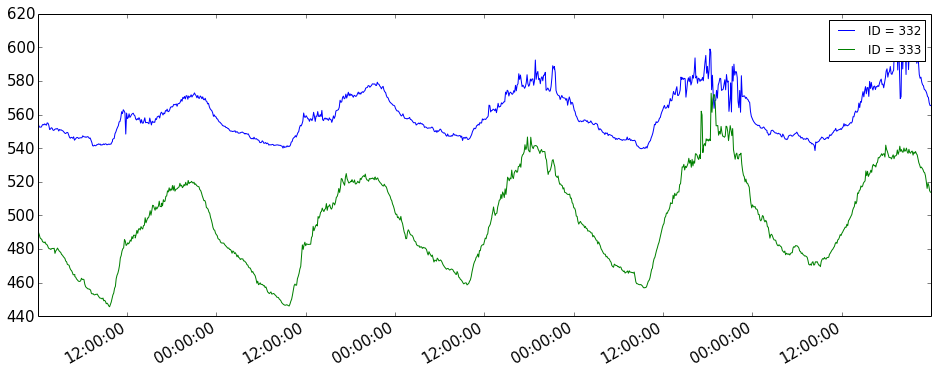

In [23]:
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,01,11,0,00,00))
t1 = utils.datettotimestamp(datetime.datetime(2014,01,15,23,59,00))
ndata332 = data332.getnewdataset(t0,t1)
ndata333 = data333.getnewdataset(t0,t1)

fig = plt.figure(figsize=(16,6))
plt.plot(ndata332.date,ndata332.radio,label='ID = 332')
plt.plot(ndata333.date,ndata333.radio,label='ID = 333')
plt.legend()
plt.gcf().autofmt_xdate()

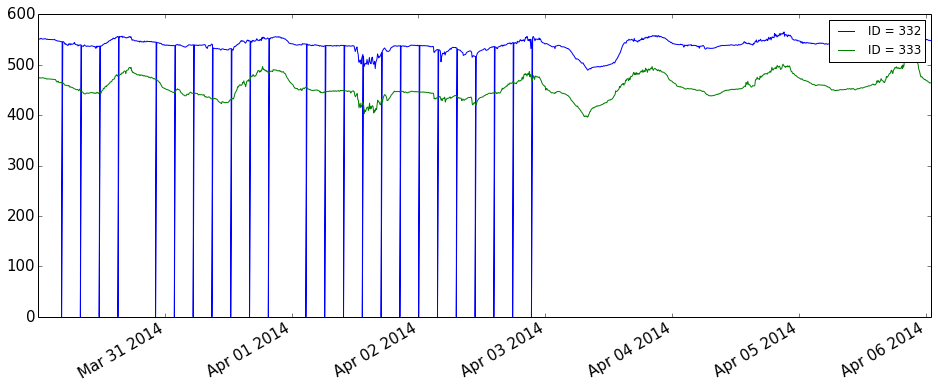

In [76]:
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,03,30,0,00,00))
t1 = utils.datettotimestamp(datetime.datetime(2014,4,5,23,59,00))
ndata332 = data332.getnewdataset(t0,t1)
ndata333 = data333.getnewdataset(t0,t1)

fig = plt.figure(figsize=(16,6))
plt.plot(ndata332.date,ndata332.radio,label='ID = 332')
plt.plot(ndata333.date,ndata333.radio,label='ID = 333')
plt.legend()
plt.gcf().autofmt_xdate()

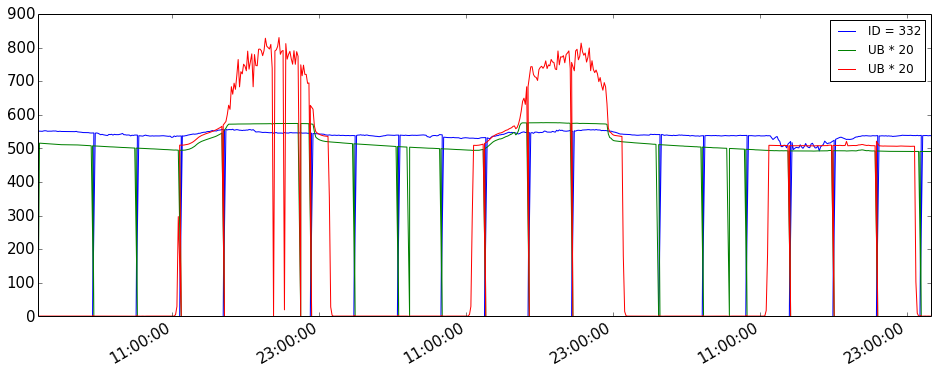

In [80]:
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,03,30,0,00,00))
t1 = utils.datettotimestamp(datetime.datetime(2014,4,1,23,59,00))
ndata332 = data332.getnewdataset(t0,t1)
#ndata333 = data333.getnewdataset(t0,t1)

fig = plt.figure(figsize=(16,6))
plt.plot(ndata332.date,ndata332.radio,label='ID = 332')
plt.plot(ndata332.date,ndata332.UBV*20,label='UB * 20')
plt.plot(ndata332.date,ndata332.solarV*20,label='UB * 20')

plt.legend()
plt.gcf().autofmt_xdate()

Strange periods... Since several data seem to be at zero, it might be a problem with comms.

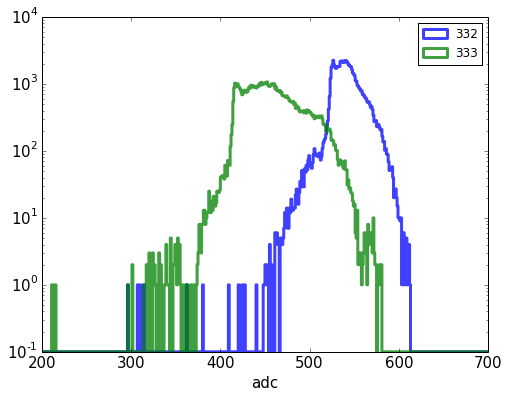

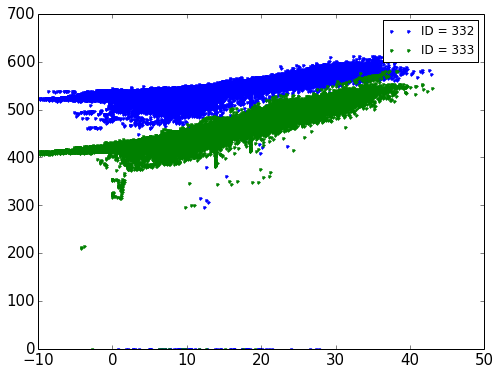

In [29]:
bins = np.linspace(0,1023,1024)
fig = plt.figure(figsize=(8,6))

n0, bins0, patches0 = plt.hist(data332.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='332')
n1, bins1, patches1 = plt.hist(data333.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='333')
plt.xlim(200,700)
plt.xlabel('adc')
plt.legend()

fig = plt.figure(figsize=(8,6))

plt.plot(data332.tempLL,data332.radio,'.',label='ID = 332')
plt.plot(data333.tempLL,data333.radio,'.',label='ID = 333')
plt.legend()


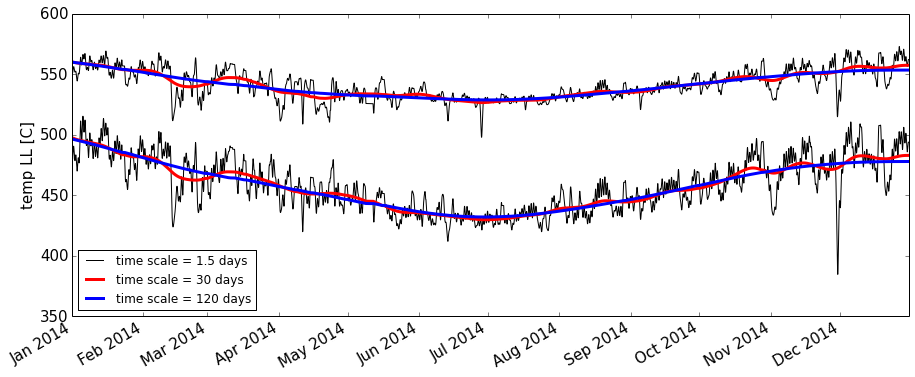

In [57]:
deltat332 = data332.time[1] - data332.time[0]
deltat333 = data333.time[1] - data333.time[0]
fig = plt.figure(figsize=(15,6))
ax1 = plt.subplot(111)
#ax2 = plt.subplot(212)
#tcuts = [1,7,30,150]
tcuts = [1.5*24,30*24,120*24]
col = ['k','r','b']
counter = 0
for t,c in zip(tcuts,col):
    fcut = 1./(t*3600)
    radiof332 = utils.lowpass(data332.radio,1./(deltat332),2,fcut)
    radiof333 = utils.lowpass(data333.radio,1./(deltat332),2,fcut)
    lw = 1
    if counter > 0:
        lw = 3

    ax1.plot(data332.date,radiof332,c=c,lw=lw)
    ax1.plot(data333.date,radiof333,c=c,lw=lw,label='time scale = '+str(t/24) +' days')
    counter+=1
plt.ylabel('temp LL [C]')
plt.legend(loc=3)
plt.gcf().autofmt_xdate()



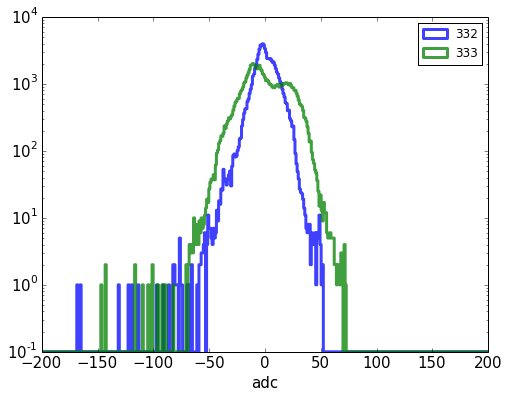

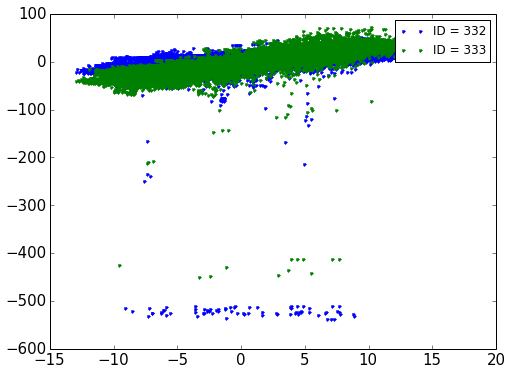

In [58]:
fdata332 = data332.getnewdataset()
fdata333 = data333.getnewdataset()


fdata332.filterHP(1.5)
fdata333.filterHP(1.5)

bins = np.linspace(-500,500,1024)
fig = plt.figure(figsize=(8,6))

n0, bins0, patches0 = plt.hist(fdata332.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='332')
n1, bins1, patches1 = plt.hist(fdata333.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='333')
plt.xlim(-200,200)
plt.xlabel('adc')
plt.legend()

fig = plt.figure(figsize=(8,6))

plt.plot(fdata332.tempLL,fdata332.radio,'.',label='ID = 332')
plt.plot(fdata333.tempLL,fdata333.radio,'.',label='ID = 333')
plt.legend()





- remove outliers

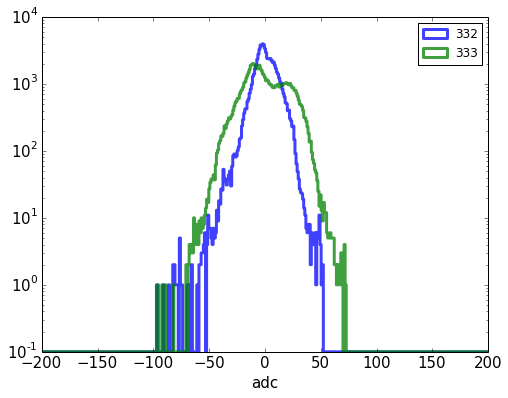

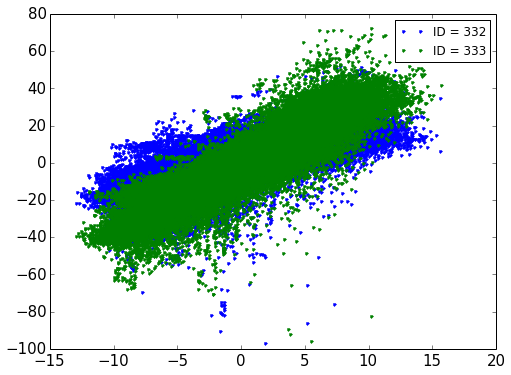

In [60]:
fdata332 = data332.getnewdataset()
fdata333 = data333.getnewdataset()


fdata332.filterHP(1.5)
fdata333.filterHP(1.5)

fdata332 = fdata332.getnewdatasetcond( (fdata332.radio > -100 ) & (fdata332.radio < 100 ))
fdata333 = fdata333.getnewdatasetcond( (fdata333.radio > -100 ) & (fdata333.radio < 100 ))

bins = np.linspace(-500,500,1024)
fig = plt.figure(figsize=(8,6))

n0, bins0, patches0 = plt.hist(fdata332.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='332')
n1, bins1, patches1 = plt.hist(fdata333.radio, bins=bins, histtype='step', lw=3, alpha=0.75,log=True,label='333')
plt.xlim(-200,200)
plt.xlabel('adc')
plt.legend()

fig = plt.figure(figsize=(8,6))

plt.plot(fdata332.tempLL,fdata332.radio,'.',label='ID = 332')
plt.plot(fdata333.tempLL,fdata333.radio,'.',label='ID = 333')
plt.legend()






### Spectra:

- raw data

/Library/Python/2.7/site-packages/IPython/kernel/__main__.py:10: RuntimeWarning: divide by zero encountered in divide
/Library/Python/2.7/site-packages/IPython/kernel/__main__.py:11: RuntimeWarning: divide by zero encountered in divide


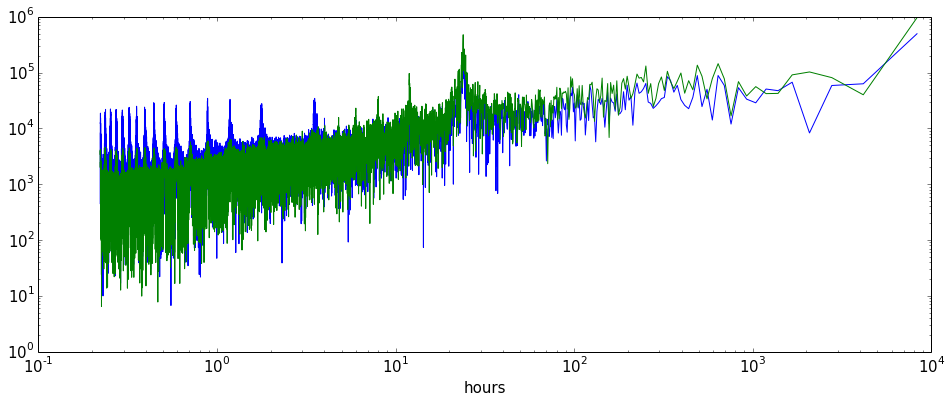

In [82]:
fft332 = np.fft.rfft(data332.radio)
fft333 = np.fft.rfft(data333.radio)


freq332 = np.fft.rfftfreq(len(data332.radio),400)
freq333 = np.fft.rfftfreq(len(data333.radio),400)

fig = plt.figure(figsize=(16,6))
#plt.loglog(1/freq1,np.absolute(fft1))
plt.loglog( (1/freq332)/3600,np.absolute(fft332))
plt.loglog( (1/freq333)/3600,np.absolute(fft333))
plt.xlabel('hours')
#plt.loglog(1/freq333,np.absolute(fft333))

#figphase = plt.figure(figsize=(16,6))
#plt.semilogx(1/freq2,np.angle(fft2))






There is some peaks for 332 at the harmonics of 24h that are less important for the 333.  
I want to check if it is due to the time periods when the baseline goes to zero

/Library/Python/2.7/site-packages/IPython/kernel/__main__.py:32: RuntimeWarning: divide by zero encountered in divide
/Library/Python/2.7/site-packages/IPython/kernel/__main__.py:36: RuntimeWarning: divide by zero encountered in divide


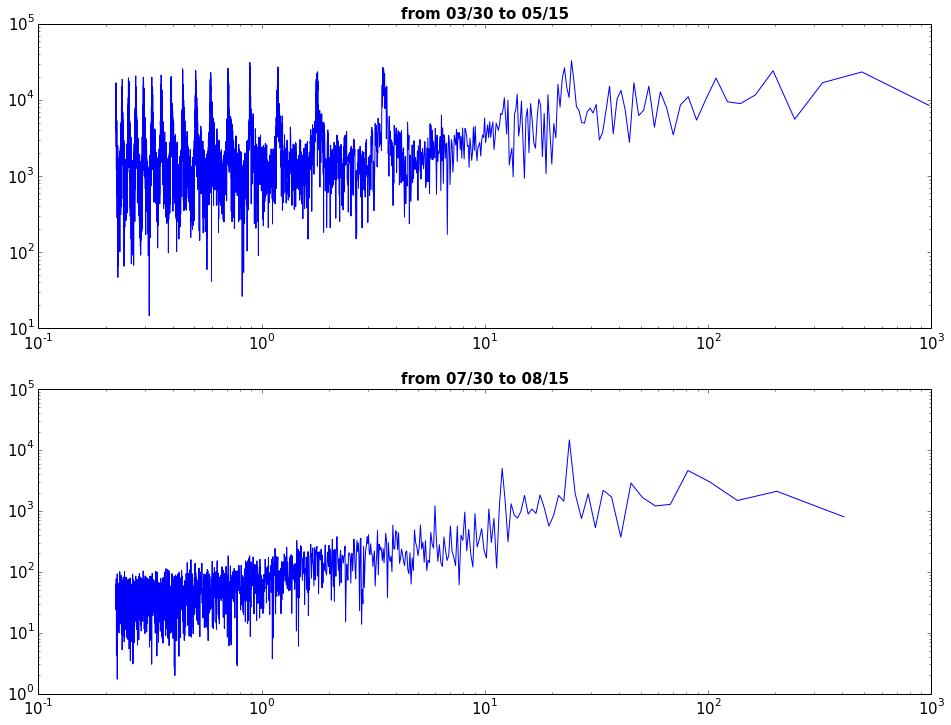

In [104]:
import datetime
dt0 = datetime.datetime(2014,3,30,0,00,00)
dt1 = datetime.datetime(2014,5,15,23,59,00) 
t0 = utils.datettotimestamp(dt0)
t1 = utils.datettotimestamp(dt1)

dt2 = datetime.datetime(2014,7,30,0,00,00)
dt3 = datetime.datetime(2014,8,15,23,59,00) 
t2 = utils.datettotimestamp(dt2)
t3 = utils.datettotimestamp(dt3)

ndata332_1 = data332.getnewdataset(t0,t1)
ndata333_1 = data333.getnewdataset(t0,t1)

ndata332_2 = data332.getnewdataset(t2,t3)
ndata333_2 = data333.getnewdataset(t2,t3)


fft332_1 = np.fft.rfft(ndata332_1.radio)
fft333_1 = np.fft.rfft(ndata333_1.radio)
freq332_1 = np.fft.rfftfreq(len(ndata332_1.radio),400)
freq333_1 = np.fft.rfftfreq(len(ndata333_1.radio),400)

fft332_2 = np.fft.rfft(ndata332_2.radio)
fft333_2 = np.fft.rfft(ndata333_2.radio)
freq332_2 = np.fft.rfftfreq(len(ndata332_2.radio),400)
freq333_2 = np.fft.rfftfreq(len(ndata333_2.radio),400)

fig = plt.figure(figsize=(16,12))
ax1 = plt.subplot(211)
ax2 = plt.subplot(212)
ax1.loglog( (1/freq332_1)/3600,np.absolute(fft332_1))
ax1.set_title('from ' + dt0.date().strftime('%m/%d') + ' to '+ dt1.date().strftime('%m/%d') ,fontsize=15,fontweight='bold')
#ax1.loglog( (1/freq333_1)/3600,np.absolute(fft333_1))

ax2.loglog( (1/freq332_2)/3600,np.absolute(fft332_2))
ax2.set_title('from ' + dt2.date().strftime('%m/%d') + ' to '+ dt3.date().strftime('%m/%d') ,fontsize=15,fontweight='bold')
#ax2.loglog( (1/freq333_2)/3600,np.absolute(fft333_2))


In fact I am going to focus on the same antenna and produce fake waveform.

First let s grab some days that are in principle without sun (i.e. the sun is too low to raise significantly the temperature). These days are mainly in june and july for the vertical antennas (for the GIGADUCK, it depends on the azimuth.)

###Back on paloma...

We are going to extract real data from Paloma, then we will try to generate fake baseline with spectra.

In [2]:
#load the data for 343
data343 = data.getnewdatawithid(343)
pfile = '/Users/romain/work/Auger/EASIER/LPSC/suntransit/data/period/controlperiod_Tsys_50K_below_2adc.txt'
data343.loadperiod(pfile)                                                                                                                       
data343.selectleafs()

###Building a baseline from data:

57
36   28
19   44
56   35
11   15
9   38
23   37


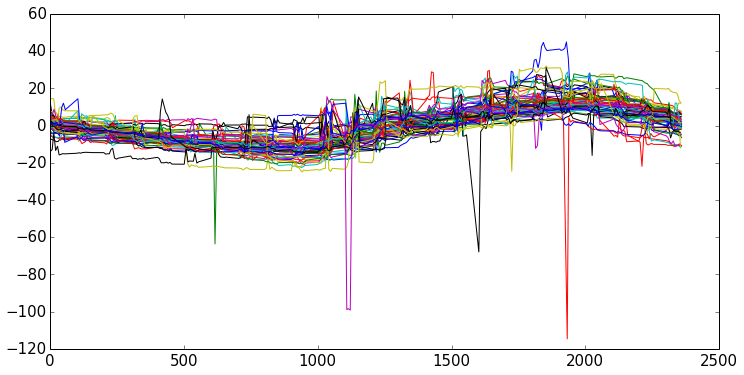

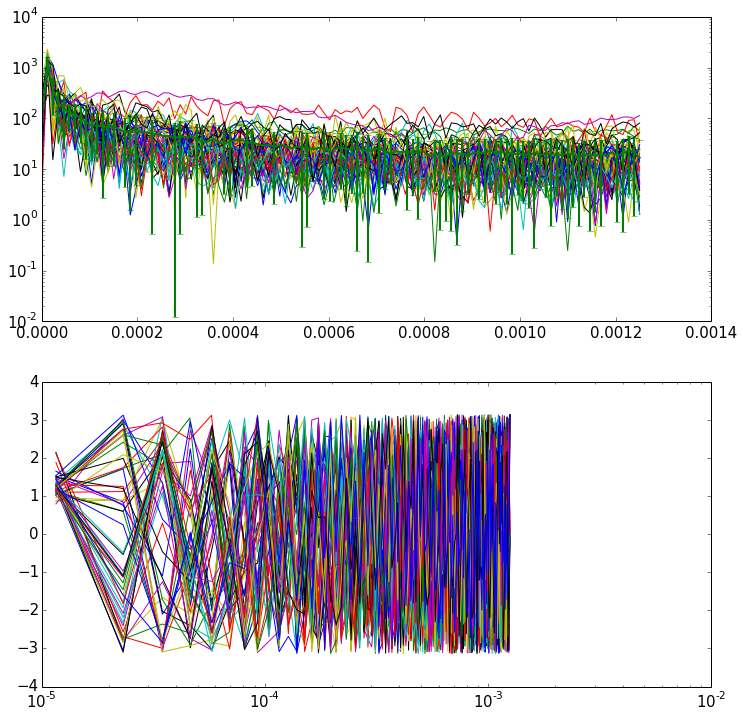

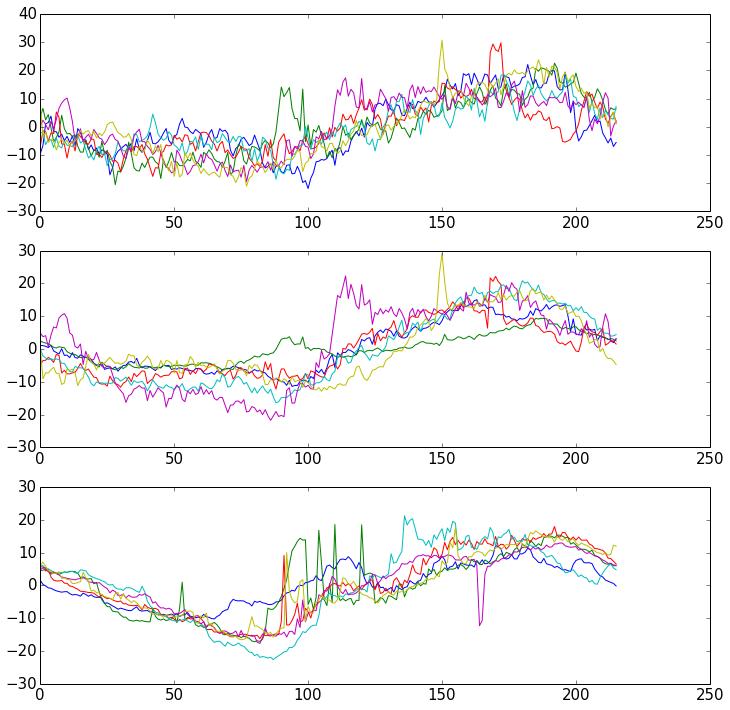

In [244]:
#select the "non sun" periods:
#ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
year = 2014
hour = 0
minute = 0
nrofpoint = np.array([])
dataarray = []
for d in range(1,364,1):
    t0 = utils.doytoUTC(year,d,hour,minute)
    t1 = utils.doytoUTC(year,d+1,hour,minute)
#    print t0,' ' , t1
    daydata343 = ndata343.getnewdataset(t0,t1)
    nrofpoint = np.append(nrofpoint,len(daydata343.radio))
#select complete days:
    if len(daydata343.radio) > 215: 
#        print utils.doytodate(year,d,hour,minute)
        dataarray.append(daydata343)

print len(dataarray)        
sizeofdat = len(dataarray)
thebins = np.linspace(0,1000,1001)
#n, bins, p = plt.hist(nrofpoint,bins = thebins)
figt = plt.figure(figsize=(12,6))
axt = plt.subplot(111) 
figf = plt.figure(figsize=(12,12))
axf1 = plt.subplot(211) 
axf2 = plt.subplot(212) 
maxlen = 216
for dat in dataarray:
    axt.plot(dat.hhmm,dat.radio)
    fft = np.fft.rfft(dat.radio)
    freq = np.fft.rfftfreq(len(dat.radio),400)
    #axf1.loglog(freq,np.absolute(fft),zorder=-32)
    axf1.plot(freq,np.absolute(fft),zorder=-32)
    axf2.semilogx(freq,np.angle(fft))
#    axt.plot(np.angle(fft)[freq < 1e-4], np.absolute(fft)[freq < 1e-4])    

# 1) create a average spectrum
maxfreq = np.fft.rfftfreq(maxlen,400)
specarray = np.ndarray(shape= (len(dataarray), len(maxfreq) ) )
phasearray =np.ndarray(shape= (len(dataarray), len(maxfreq) ) )
count = 0

for dat in dataarray:
    fft = np.fft.rfft(dat.radio)
    spec = np.absolute(fft)
    phase = np.angle(fft)
    freq = np.fft.rfftfreq(len(dat.radio),400)
    #    print spec
    spec = np.interp(maxfreq,freq,spec)
    phase = np.interp(maxfreq,freq,phase)
    #    print spec
    specarray[count] = spec
    phasearray[count] = phase
    count +=1

    
# with errorbars: clip non-positive values
#axf1 = plt.subplot(111)
#axf1.set_xscale("log", nonposx='clip')
axf1.set_yscale("log")

meanspec = np.mean(specarray,axis=0)
stdspec = np.std(specarray,axis=0)
#print stdspec
axf1.errorbar(maxfreq,meanspec,yerr=stdspec,lw=2)
#plt.errorbar(x, y, xerr=0.1*x, yerr=5.0 + 0.75*y)
# 2) draw random spectrum
nfake = 6
figfake = plt.figure(figsize=(12,12))
ax1 = plt.subplot(311)
ax2 = plt.subplot(312)
ax3 = plt.subplot(313)
for i in range(nfake):
    fakespec = np.array([])
    for m,s in zip(meanspec,stdspec):
        specpoint = np.random.normal(m,s)
        fakespec = np.append(fakespec,specpoint)
# 3) draw a particular phase
    phaseindex = int(np.random.uniform(0,sizeofdat))
    phase = phasearray[phaseindex]
    fakefft = fakespec*np.exp(1J*phase)
    fakebl = np.fft.irfft(fakefft)
    
    specindex = int(np.random.uniform(0,sizeofdat))
    fakespec2 = specarray[specindex]
    fakefft2 = fakespec2*np.exp(1J*phase)
    fakebl2 = np.fft.irfft(fakefft2)
    print specindex, ' ' , phaseindex
    truefft = specarray[i]* np.exp(1J*phasearray[i])
    truebl = np.fft.irfft(truefft)
    t = np.arange(0,len(newbl),1)
    ax1.plot(t,fakebl.real)
    ax2.plot(t,fakebl2.real)
    ax3.plot(t,truebl.real)

now we correct first and then produce the fake baseline.

6
5   5
2   0
1   3
4   1
1   0
4   0


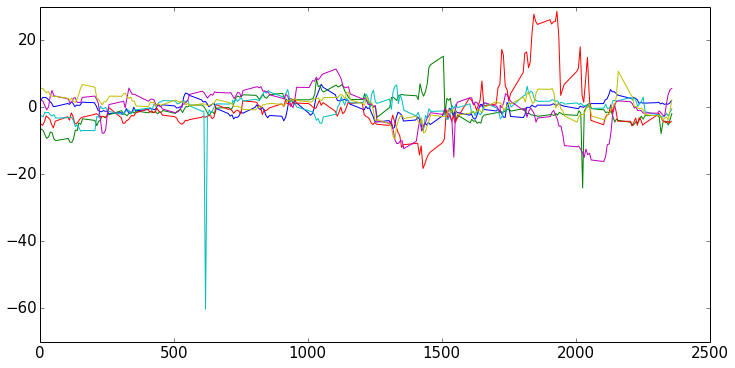

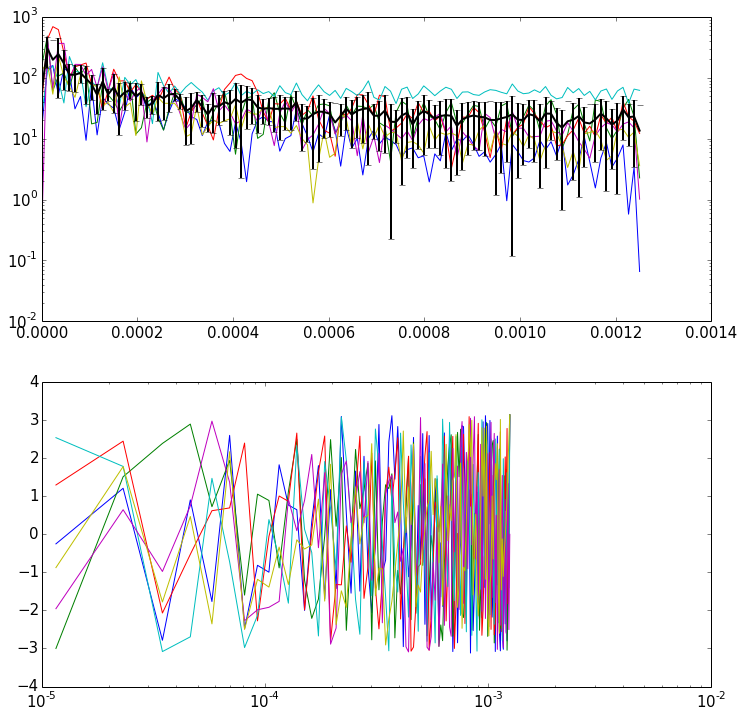

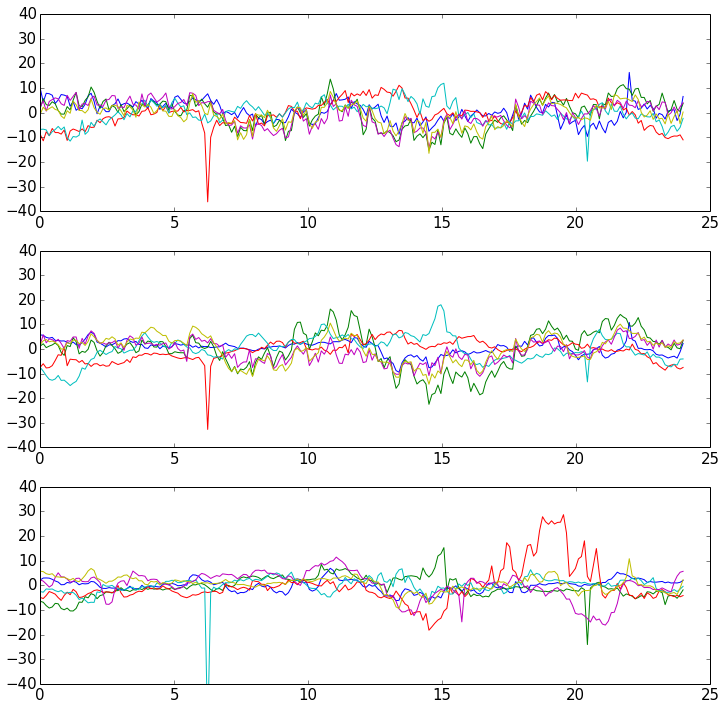

In [5]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

year = 2014
hour = 0
minute = 0
nrofpoint = np.array([])
dataarray = []
for d in range(1,364,1):
    t0 = utils.doytoUTC(year,d,hour,minute)
    t1 = utils.doytoUTC(year,d+1,hour,minute)
#    print t0,' ' , t1
    daydata343 = ndata343.getnewdataset(t0,t1)
    nrofpoint = np.append(nrofpoint,len(daydata343.radio))
#select complete days:
    if len(daydata343.radio) > 215: 
#        print utils.doytodate(year,d,hour,minute)
        dataarray.append(daydata343)

print len(dataarray)        
sizeofdat = len(dataarray)
thebins = np.linspace(0,1000,1001)
#n, bins, p = plt.hist(nrofpoint,bins = thebins)
figt = plt.figure(figsize=(12,6))
axt = plt.subplot(111) 
figf = plt.figure(figsize=(12,12))
axf1 = plt.subplot(211) 
axf2 = plt.subplot(212) 
maxlen = 216
for dat in dataarray:
    axt.plot(dat.hhmm,dat.radioc)
    fft = np.fft.rfft(dat.radioc)
    freq = np.fft.rfftfreq(len(dat.radioc),400)
    #axf1.loglog(freq,np.absolute(fft),zorder=-32)
    axf1.plot(freq,np.absolute(fft),zorder=-32)
    axf2.semilogx(freq,np.angle(fft))
#    axt.plot(np.angle(fft)[freq < 1e-4], np.absolute(fft)[freq < 1e-4])    

# 1) create a average spectrum
maxfreq = np.fft.rfftfreq(maxlen,400)
specarray = np.ndarray(shape= (len(dataarray), len(maxfreq) ) )
phasearray =np.ndarray(shape= (len(dataarray), len(maxfreq) ) )
count = 0

for dat in dataarray:
    fft = np.fft.rfft(dat.radioc)
    spec = np.absolute(fft)
    phase = np.angle(fft)
    freq = np.fft.rfftfreq(len(dat.radioc),400)
    #    print spec
    spec = np.interp(maxfreq,freq,spec)
    phase = np.interp(maxfreq,freq,phase)
    #    print spec
    specarray[count] = spec
    phasearray[count] = phase
    count +=1

    
# with errorbars: clip non-positive values
#axf1 = plt.subplot(111)
#axf1.set_xscale("log", nonposx='clip')
axf1.set_yscale("log")

meanspec = np.mean(specarray,axis=0)
stdspec = np.std(specarray,axis=0)
#print stdspec
axf1.errorbar(maxfreq,meanspec,yerr=stdspec,lw=2)
#plt.errorbar(x, y, xerr=0.1*x, yerr=5.0 + 0.75*y)
# 2) draw random spectrum
nfake = 6
figfake = plt.figure(figsize=(12,12))
ax1 = plt.subplot(311)
ax2 = plt.subplot(312)
ax3 = plt.subplot(313)
fakebls = []
fakebls2 = []
for i in range(nfake):
    fakespec = np.array([])
    for m,s in zip(meanspec,stdspec):
        specpoint = np.random.normal(m,s)
        fakespec = np.append(fakespec,specpoint)
# 3) draw a particular phase
    phaseindex = int(np.random.uniform(0,sizeofdat))
    phase = phasearray[phaseindex]
    fakefft = fakespec*np.exp(1J*phase)
    fakebl = np.fft.irfft(fakefft)
    
    specindex = int(np.random.uniform(0,sizeofdat))
    if specindex == phaseindex:
        specindex = int(np.random.uniform(0,sizeofdat))
    fakespec2 = specarray[specindex]
    fakefft2 = fakespec2*np.exp(1J*phase)
    fakebl2 = np.fft.irfft(fakefft2)
    print specindex, ' ' , phaseindex
    truefft = specarray[i]* np.exp(1J*phasearray[i])
    truebl = np.fft.irfft(truefft)
    t = np.linspace(0,24,len(truebl))
    fakebls.append(fakebl)
    fakebls2.append(fakebl2)
    ax1.plot(t,fakebl.real)
    ax1.set_ylim(-40,40)
    ax2.plot(t,fakebl2.real)
    ax2.set_ylim(-40,40)
    ax3.plot(t,truebl.real)
    ax3.set_ylim(-40,40)

### produce the fake signal

The signal is going to be basically a gaussian curve the maximum and the sigma depending on the day (if the sun is emitting a lot and if the sun goes into the main lobe)  
We have another code to compute the sun transit and its expected signal including the antenna patern. (/Users/romain/work/Auger/EASIER/LPSC/suntransit/script/analysis)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
average time of max =  14.1176180414  average sigma =  2.06598114044


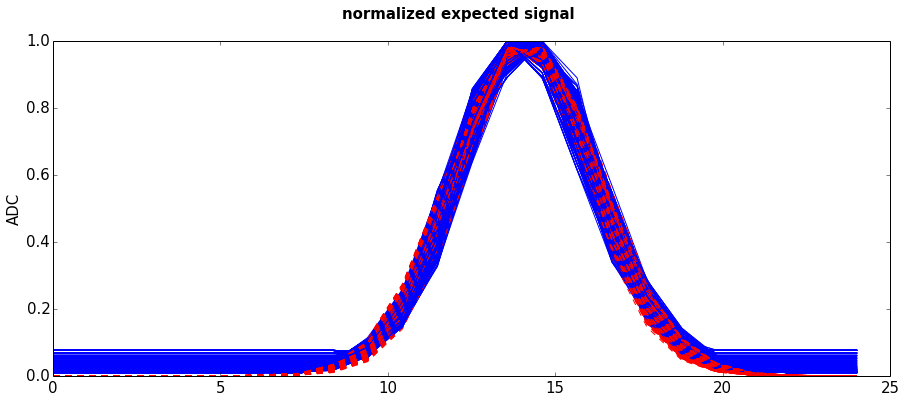

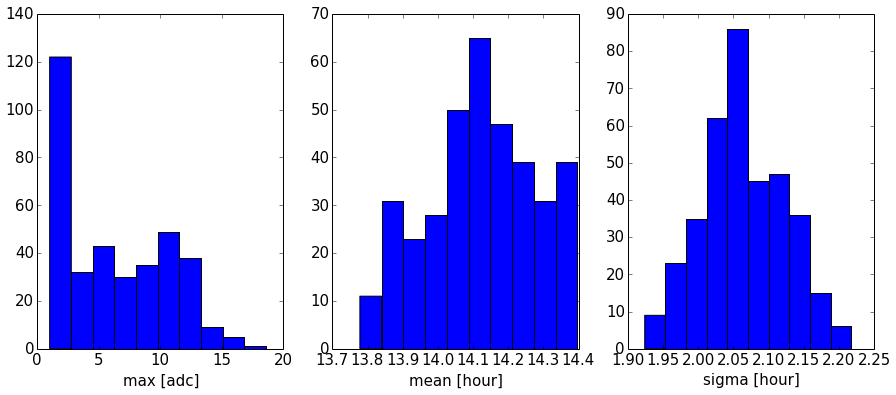

In [11]:
#####################################
## need to restart kernel for this ## 
## (because of utils conflict) ######
#####################################
import os
os.chdir('/Users/romain/work/Auger/EASIER/LPSC/suntransit/script/analysis/')
%load_ext autoreload
%autoreload 2
%matplotlib inline
%run fitdailyflux.py 

The signal expected looks always almost the same, it is very well fitted with a gaussian curve, centred around 14h (17h UTC) and with a sigma of ~2. We can thus simulate the signal with this type of curve and vary the maximum only.

- the fake baseline:
(same thing as before, but implemented into the dataset class)

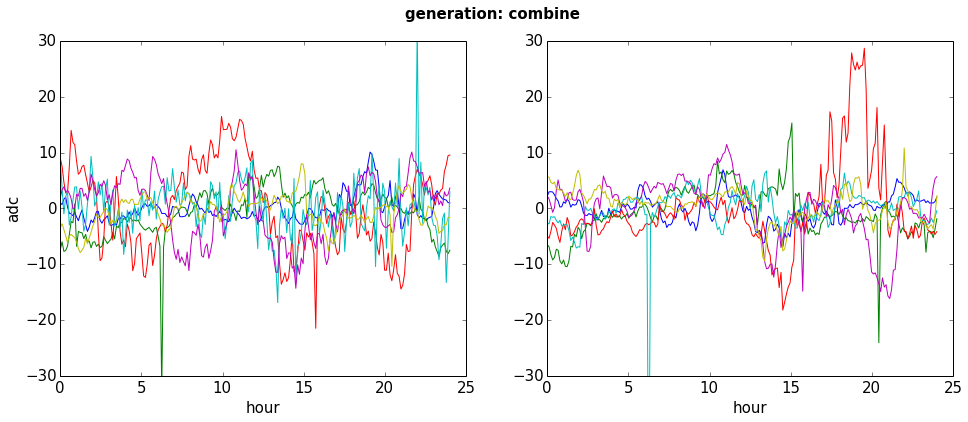

In [79]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#fakebl = ndata343.getfakedailybaseline('random')
typeofbl = 'combine'
fakebl = ndata343.getfakedailybaseline(typeofbl)
truebl = ndata343.gettruedailybaseline()
fig = plt.figure(figsize=(16,6))
fig.suptitle('generation: ' + typeofbl, fontsize=15, fontweight='bold')
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
for f in fakebl[2::6]:
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f)
    ax1.set_xlabel('hour')
    ax1.set_ylabel('adc')
    ax1.set_ylim(-30,30)
    
for tbl in truebl:
    t = np.linspace(0,24,len(tbl))
    ax2.plot(t,tbl)
    ax2.set_xlabel('hour')
#    ax2.set_ylabel('adc')
    ax2.set_ylim(-30,30)

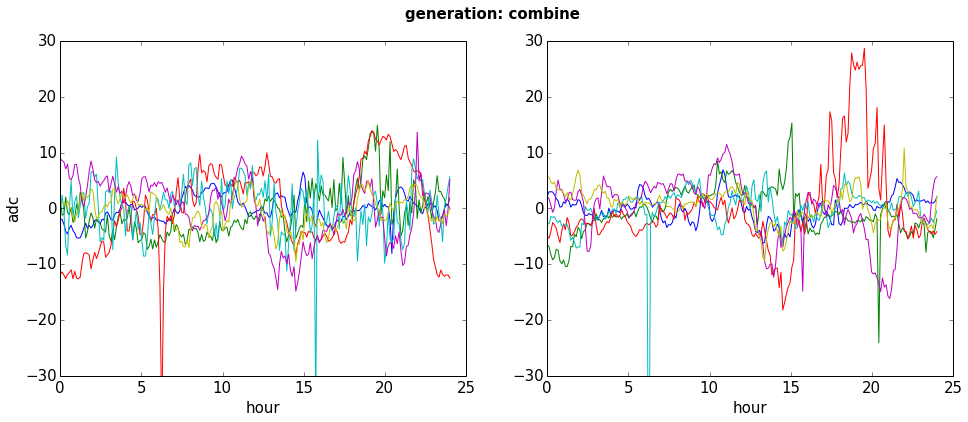

In [80]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)


typeofbl = 'combine'
fakebl = ndata343.getfakedailybaseline(typeofbl)
truebl = ndata343.gettruedailybaseline()
fig = plt.figure(figsize=(16,6))
fig.suptitle('generation: ' + typeofbl, fontsize=15, fontweight='bold')
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
for f in fakebl[1::6]:
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f)
    ax1.set_xlabel('hour')
    ax1.set_ylabel('adc')
    ax1.set_ylim(-30,30)
    
for tbl in truebl:
    t = np.linspace(0,24,len(tbl))
    ax2.plot(t,tbl)
    ax2.set_xlabel('hour')
#    ax2.set_ylabel('adc')
    ax2.set_ylim(-30,30)

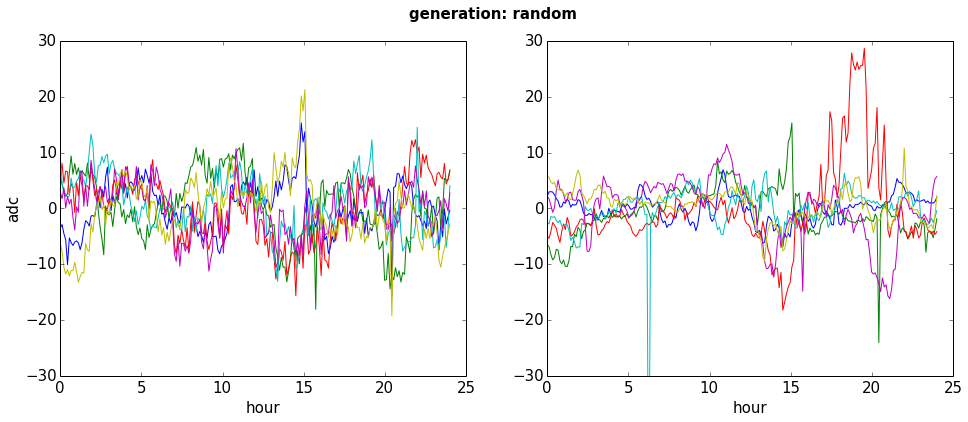

In [81]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)
typeofbl = 'random'
fakebl = ndata343.getfakedailybaseline(typeofbl)
truebl = ndata343.gettruedailybaseline()

fig = plt.figure(figsize=(16,6))
fig.suptitle('generation: ' + typeofbl, fontsize=15, fontweight='bold')
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
for f in fakebl[1::6]:
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f)
    ax1.set_xlabel('hour')
    ax1.set_ylabel('adc')
    ax1.set_ylim(-30,30)
    
for tbl in truebl:
    t = np.linspace(0,24,len(tbl))
    ax2.plot(t,tbl)
    ax2.set_xlabel('hour')
#    ax2.set_ylabel('adc')
    ax2.set_ylim(-30,30)

- now we integrate the fake signal into the fake baseline:

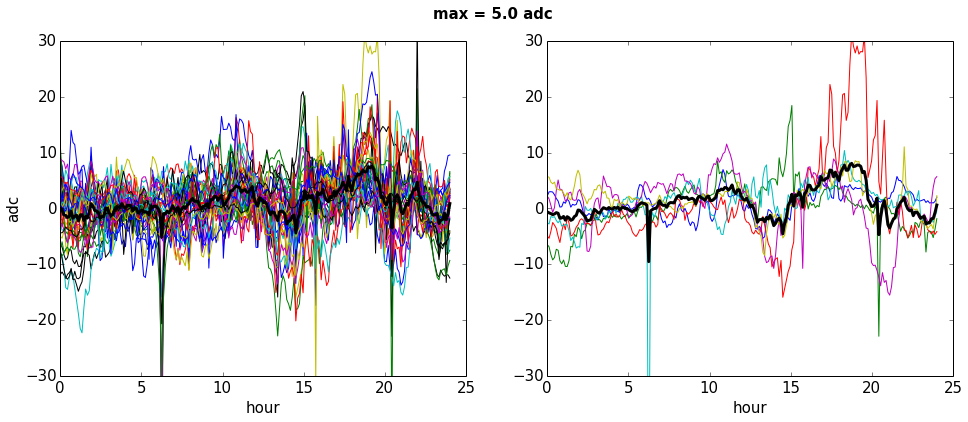

In [97]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

typeofbl = 'combine'
fakebl = ndata343.getfakedailybaseline(typeofbl)
truebl = ndata343.gettruedailybaseline()
blsize= len(fakebl[0])
time = np.linspace(0,24,blsize) 
#gaussian parameters for fake signal:
a = 5. # adc counts
b = 17 # hour of max (14+3)
c = 2 # sigma in hour
fakesignal = utils.gauss(time,a,b,c)

#plt.plot(time,fakesignal)
fig = plt.figure(figsize=(16,6))
plt.suptitle('max = ' + str(a) + ' adc',fontsize=15,fontweight='bold')
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
faketot = []
truetot = []
#for f in fakebl[2::6]:
for f in fakebl:
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f+fakesignal)
    ax1.set_xlabel('hour')
    ax1.set_ylabel('adc')
    ax1.set_ylim(-30,30)
    faketot.append(f+fakesignal)
    
for tbl in truebl:
    t = np.linspace(0,24,len(tbl))
    ax2.plot(t,tbl+fakesignal)
    truetot.append(tbl+fakesignal)
    ax2.set_xlabel('hour')
#    ax2.set_ylabel('adc')
    ax2.set_ylim(-30,30)
fakesum = np.mean(faketot,axis=0)
truesum = np.mean(truetot,axis=0)
ax1.plot(time,fakesum,'k',lw=3)
ax2.plot(time,truesum,'k',lw=3)

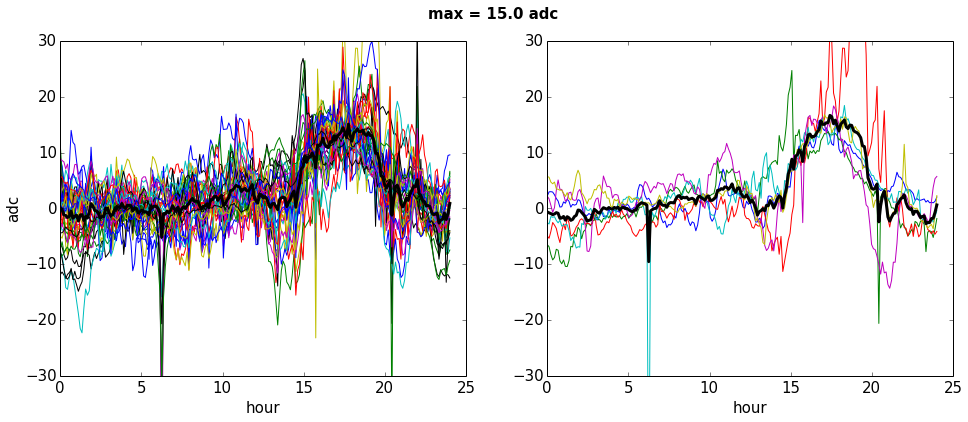

In [100]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

typeofbl = 'combine'
fakebl = ndata343.getfakedailybaseline(typeofbl)
truebl = ndata343.gettruedailybaseline()
blsize= len(fakebl[0])
time = np.linspace(0,24,blsize) 
#gaussian parameters for fake signal:
a = 15. # adc counts
b = 17 # hour of max (14+3)
c = 2 # sigma in hour
fakesignal = utils.gauss(time,a,b,c)

#plt.plot(time,fakesignal)
fig = plt.figure(figsize=(16,6))
plt.suptitle('max = ' + str(a) + ' adc',fontsize=15,fontweight='bold')
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
faketot = []
truetot = []
#for f in fakebl[2::6]:
for f in fakebl:
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f+fakesignal)
    ax1.set_xlabel('hour')
    ax1.set_ylabel('adc')
    ax1.set_ylim(-30,30)
    faketot.append(f+fakesignal)
    
for tbl in truebl:
    t = np.linspace(0,24,len(tbl))
    ax2.plot(t,tbl+fakesignal)
    truetot.append(tbl+fakesignal)
    ax2.set_xlabel('hour')
#    ax2.set_ylabel('adc')
    ax2.set_ylim(-30,30)
fakesum = np.mean(faketot,axis=0)
truesum = np.mean(truetot,axis=0)
ax1.plot(time,fakesum,'k',lw=3)
ax2.plot(time,truesum,'k',lw=3)

###analysing my fake data set:

- example of fake data set:

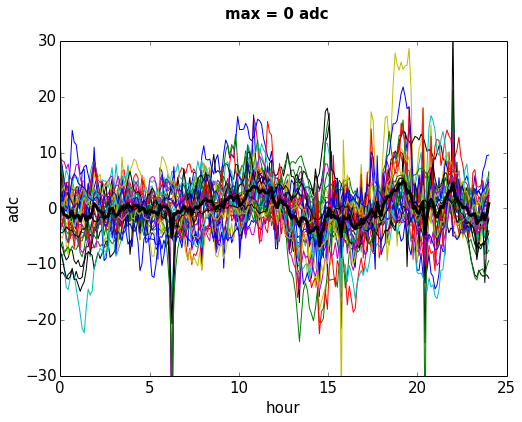

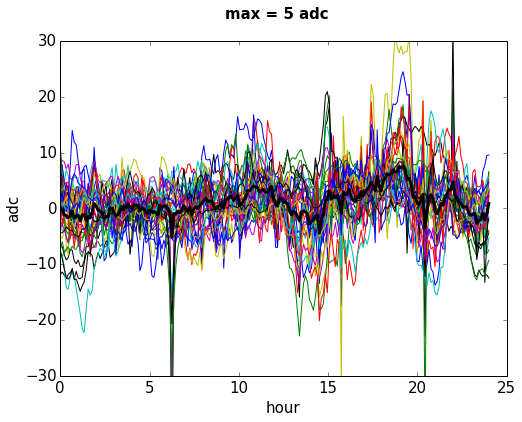

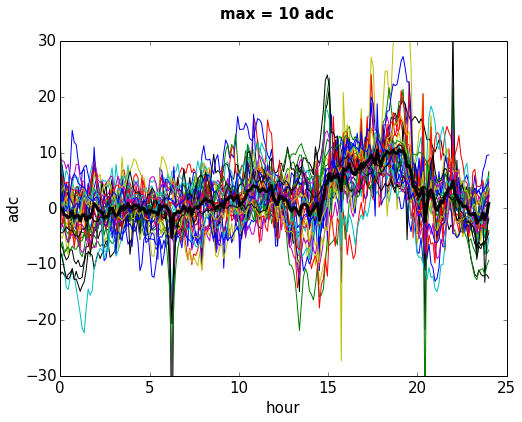

In [153]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = 0
maxadc2 = 5
maxadc3 = 10
#typeofbl = 'random'
typeofbl = 'combine'
fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxadc1)
fakebl2 = ndata343.getfakedailybaseline(typeofbl,maxadc2)
fakebl3 = ndata343.getfakedailybaseline(typeofbl,maxadc3)

#plt.plot(time,fakesignal)
fig1 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc1) + ' adc',fontsize=15,fontweight='bold')
ax1 = plt.subplot(111)
fig2 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc2) + ' adc',fontsize=15,fontweight='bold')
ax2 = plt.subplot(111)
fig3 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc3) + ' adc',fontsize=15,fontweight='bold')
ax3 = plt.subplot(111)
faketot1 = []
faketot2 = []
faketot3 = []
#for f in fakebl[1::10]:
for f1,f2,f3 in zip(fakebl1,fakebl2,fakebl3):
    t = np.linspace(0,24,len(f))
    ax1.plot(t,f1)
    ax2.plot(t,f2)
    ax3.plot(t,f3)

    ax1.set_ylim(-30,30)
    ax2.set_ylim(-30,30)
    ax3.set_ylim(-30,30)
    faketot1.append(f1)
    faketot2.append(f2)
    faketot3.append(f3)
    
fakesum1 = np.mean(faketot1,axis=0)
fakesum2 = np.mean(faketot2,axis=0)
fakesum3 = np.mean(faketot3,axis=0)
ax1.plot(time,fakesum1,'k',lw=3,label='average')
ax2.plot(time,fakesum2,'k',lw=3,label='average')
ax3.plot(time,fakesum3,'k',lw=3,label='average')
ax1.set_xlabel('hour')
ax1.set_ylabel('adc')

ax2.set_xlabel('hour')
ax2.set_ylabel('adc')

ax3.set_xlabel('hour')
ax3.set_ylabel('adc')


**problem**: my problem here is to find a way to define a signal to noise, i.e. how to define the noise, how to define the signal.  
For the noise: I could take the std of the first part of the day, but at the same time what we are interested in is how varies the BL in the period around 17h.  
For the signal: a maximum is maybe not the best estimator for the signal, since we now it will last for at least two hours. 

- try a sliding window:

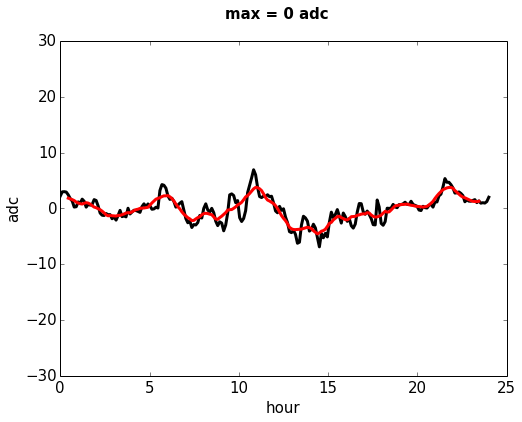

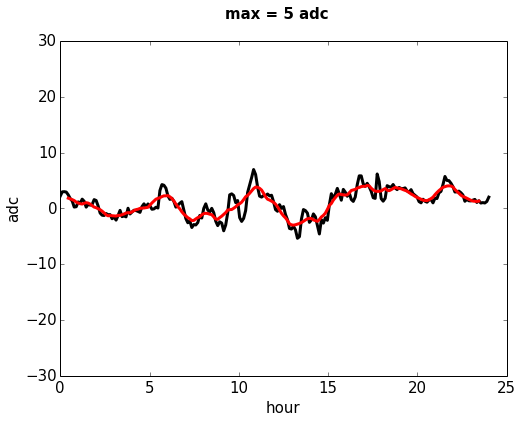

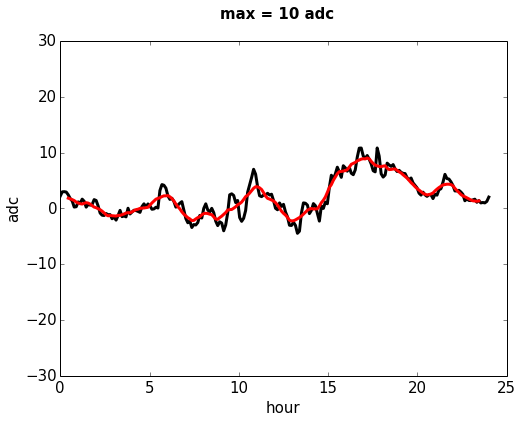

In [167]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = 0
maxadc2 = 5
maxadc3 = 10
#typeofbl = 'random'
typeofbl = 'combine'
fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxadc1)
fakebl2 = ndata343.getfakedailybaseline(typeofbl,maxadc2)
fakebl3 = ndata343.getfakedailybaseline(typeofbl,maxadc3)

#plt.plot(time,fakesignal)
fig1 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc1) + ' adc',fontsize=15,fontweight='bold')
ax1 = plt.subplot(111)
fig2 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc2) + ' adc',fontsize=15,fontweight='bold')
ax2 = plt.subplot(111)
fig3 = plt.figure(figsize=(8,6))
plt.suptitle('max = ' + str(maxadc3) + ' adc',fontsize=15,fontweight='bold')
ax3 = plt.subplot(111)
faketot1 = []
faketot2 = []
faketot3 = []
sfaketot1 = []
sfaketot2 = []
sfaketot3 = []


#for f in fakebl[1::10]:
window = 10 # bins
for f1,f2,f3 in zip(fakebl1[:1],fakebl2[:1],fakebl3[:1]):
    t = np.linspace(0,24,len(f))
    s1 = utils.slidingwindow(f1,window,'valid')
    s2 = utils.slidingwindow(f2,window,'valid')
    s3 = utils.slidingwindow(f3,window,'valid')

    ts = utils.getxforconv(t,len(s1))
#    print len(s1), ' ' ,len(ts)
#    ax1.plot(t,f1)
    ax1.plot(ts,s1)

#    ax2.plot(t,f2)
    ax2.plot(ts,s2)

#    ax3.plot(t,f3)
    ax3.plot(ts,s3)


    ax1.set_ylim(-30,30)
    ax2.set_ylim(-30,30)
    ax3.set_ylim(-30,30)
    faketot1.append(f1)
    faketot2.append(f2)
    faketot3.append(f3)
  
    sfaketot1.append(s1)
    sfaketot2.append(s2)
    sfaketot3.append(s3)
    
fakesum1 = np.mean(faketot1,axis=0)
fakesum2 = np.mean(faketot2,axis=0)
fakesum3 = np.mean(faketot3,axis=0)
sfakesum1 = np.mean(sfaketot1,axis=0)
sfakesum2 = np.mean(sfaketot2,axis=0)
sfakesum3 = np.mean(sfaketot3,axis=0)


ax1.plot(time,fakesum1,'k',lw=3,label='average')
ax2.plot(time,fakesum2,'k',lw=3,label='average')
ax3.plot(time,fakesum3,'k',lw=3,label='average')
ax1.plot(ts,sfakesum1,'r',lw=3,label='average')
ax2.plot(ts,sfakesum2,'r',lw=3,label='average')
ax3.plot(ts,sfakesum3,'r',lw=3,label='average')


ax1.set_xlabel('hour')
ax1.set_ylabel('adc')

ax2.set_xlabel('hour')
ax2.set_ylabel('adc')

ax3.set_xlabel('hour')
ax3.set_ylabel('adc')



- adapted filtering:

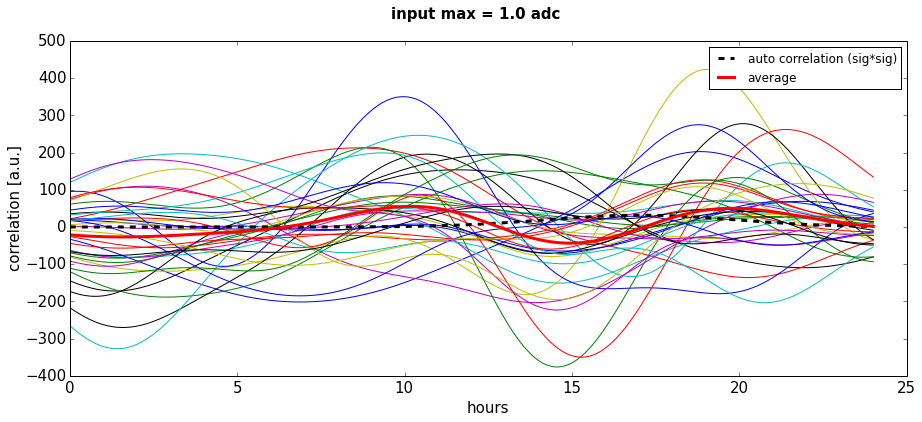

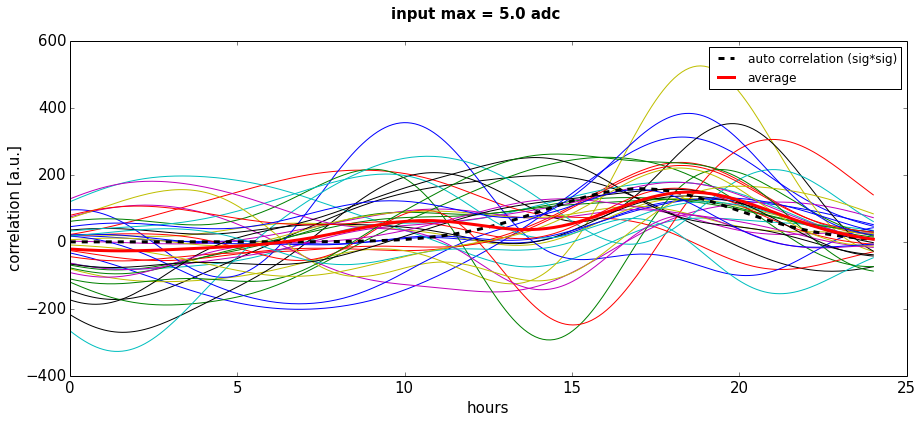

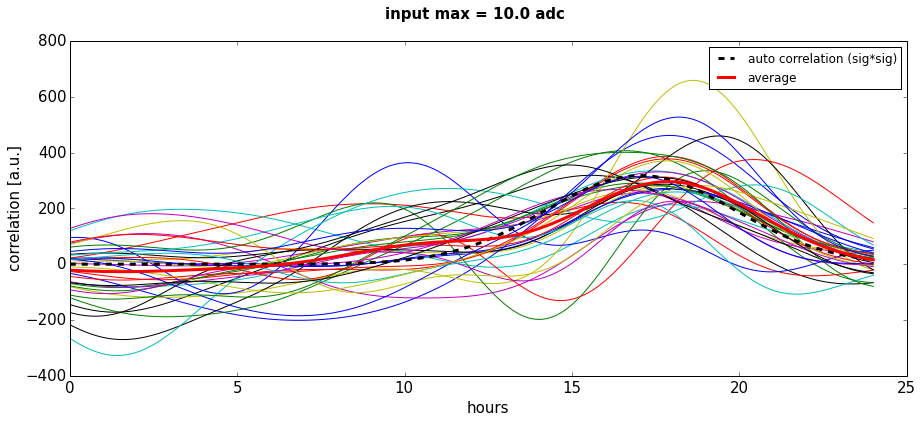

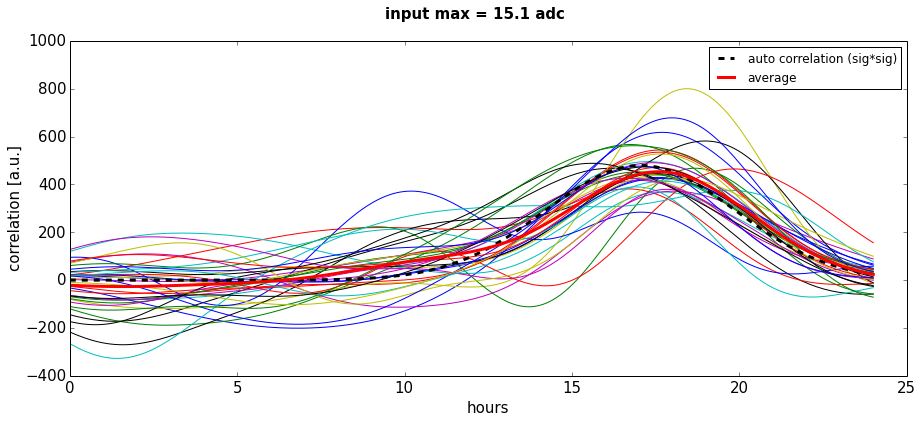

In [464]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = np.array([1.,5.,10.,15.,50])
maxadc2 = np.array([1.,5.,10.,15.1])

#typeofbl = 'random'
typeofbl = 'combine'

#for f in fakebl[1::10]:
window = 10 # bins

tofmax = 17
sigma = 2
for maxg in maxadc2:
    fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
    fig = plt.figure(figsize=(15,6))
    plt.suptitle('input max = ' + str(maxg) + ' adc',fontsize=15,fontweight='bold')
    tot = []
    
    for f1 in fakebl1:
        tmax= 24
        tmin = 0
        t = np.linspace(tmin,tmax,len(f))
        g = utils.gauss(t,1,tofmax,sigma)
        gideal = utils.gauss(t,maxg,tofmax,sigma)
        mf1 = utils.matchedfilter(f1,g)
        mfideal = utils.matchedfilter(gideal,g)
        tofmax = 17
        leftside =  int( (float((tmax - tofmax))/(tmax-tmin)) * len(t) )
        rightside = int( (float((tofmax - tmin))/(tmax-tmin)) * len(t) )
        tm = utils.getxforconv(t,len(mf1))
        nmf1 =mf1[leftside:len(mf1) - rightside]
        nt = np.linspace(0,24,len(nmf1))
        tot.append(nmf1)
        plt.plot(nt,nmf1)
    plt.plot(nt,mfideal[leftside:len(mf1) - rightside],'k',ls='--',lw=3,label='auto correlation (sig*sig)')
    mean = np.mean(tot,axis=0)
    plt.plot(nt,mean,'r',ls='-',lw=3,label='average')
    plt.xlabel('hours')
    plt.ylabel('correlation [a.u.]')

    plt.legend()

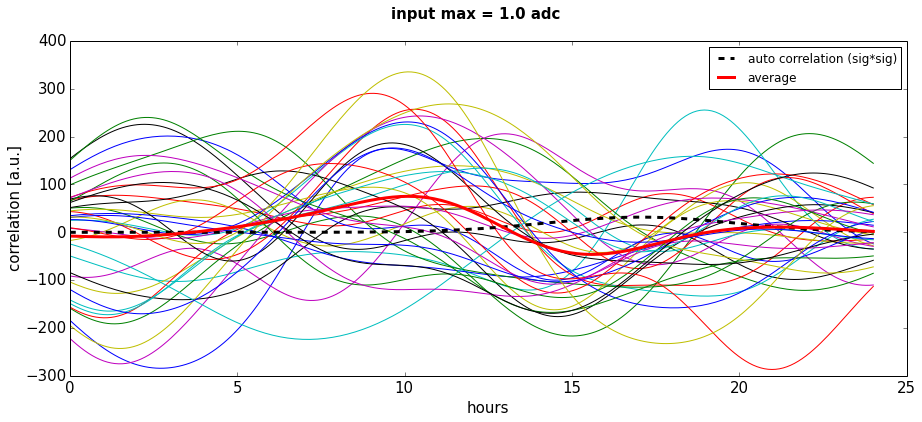

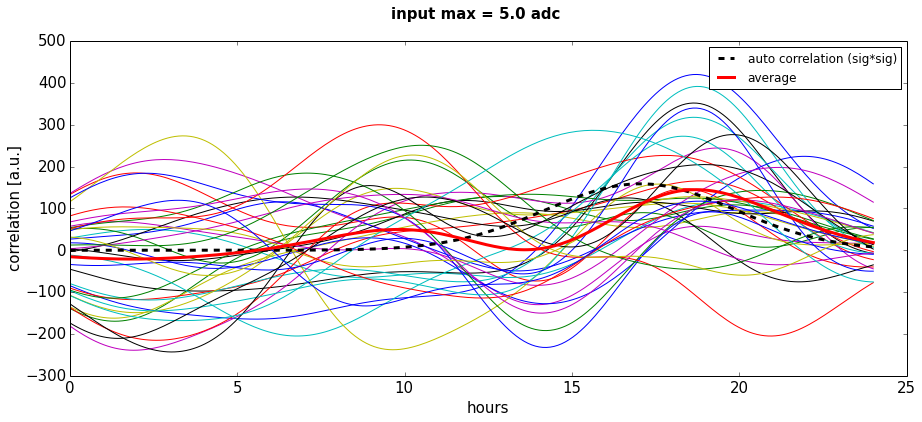

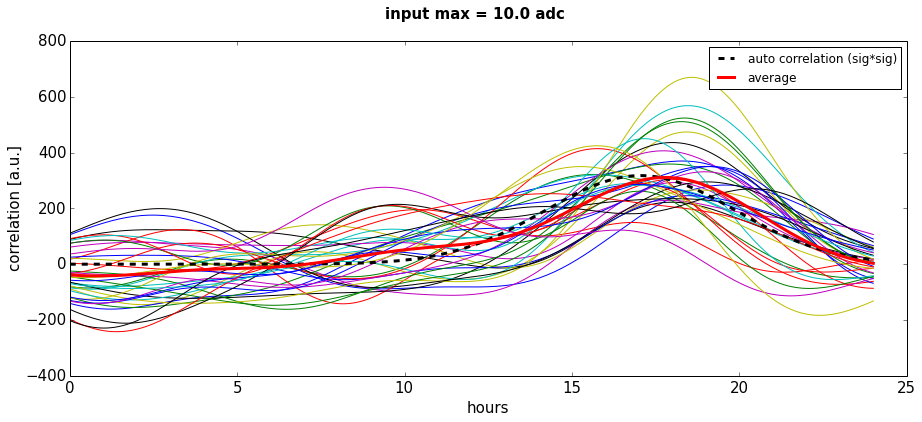

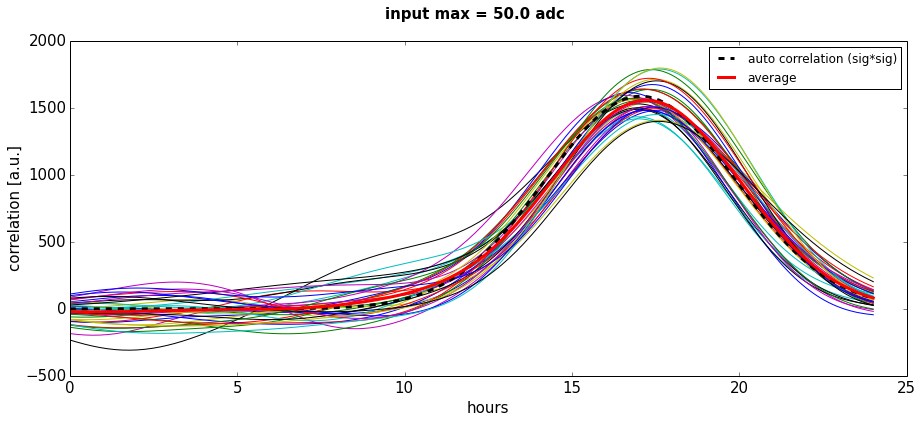

In [259]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = np.array([1.,5.,10.,50.])
typeofbl = 'random'
#typeofbl = 'combine'

#for f in fakebl[1::10]:
window = 10 # bins

tofmax = 17
sigma = 2
for maxg in maxadc1:
    fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
    fig = plt.figure(figsize=(15,6))
    plt.suptitle('input max = ' + str(maxg) + ' adc',fontsize=15,fontweight='bold')
    tot = []
    
    for f1 in fakebl1:
        tmax= 24
        tmin = 0
        t = np.linspace(tmin,tmax,len(f))
        g = utils.gauss(t,1,tofmax,sigma)
        gideal = utils.gauss(t,maxg,tofmax,sigma)
        mf1 = utils.matchedfilter(f1,g)
        mfideal = utils.matchedfilter(gideal,g)
        tofmax = 17
        leftside =  int( (float((tmax - tofmax))/(tmax-tmin)) * len(t) )
        rightside = int( (float((tofmax - tmin))/(tmax-tmin)) * len(t) )
        tm = utils.getxforconv(t,len(mf1))
        nmf1 =mf1[leftside:len(mf1) - rightside]
        nt = np.linspace(0,24,len(nmf1))
        tot.append(nmf1)
        plt.plot(nt,nmf1)
    plt.plot(nt,mfideal[leftside:len(mf1) - rightside],'k',ls='--',lw=3,label='auto correlation (sig*sig)')
    mean = np.mean(tot,axis=0)
    plt.plot(nt,mean,'r',ls='-',lw=3,label='average')
    plt.xlabel('hours')
    plt.ylabel('correlation [a.u.]')

    plt.legend()

- now we construct the distribution to be compared with data  
we plot:
- the maximum in the expected time window ( > 15 && < 20)
- the maximum outside the expected time window (< 15 h ||  > 20h)

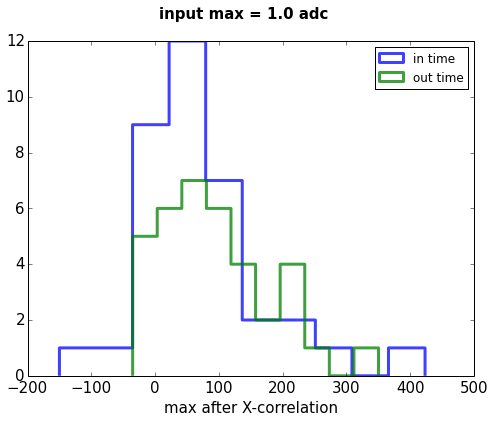

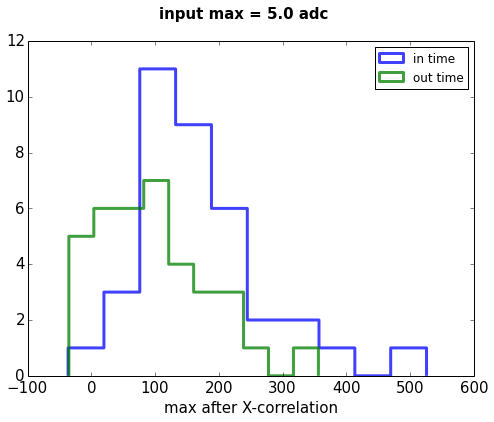

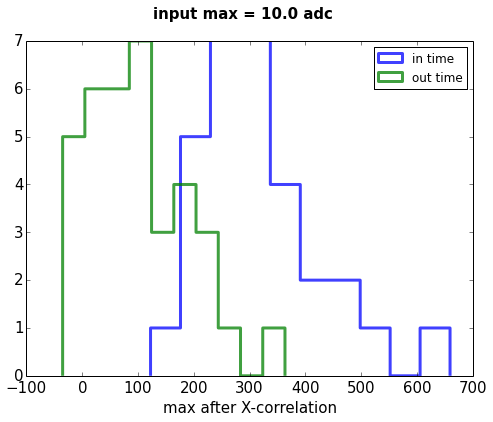

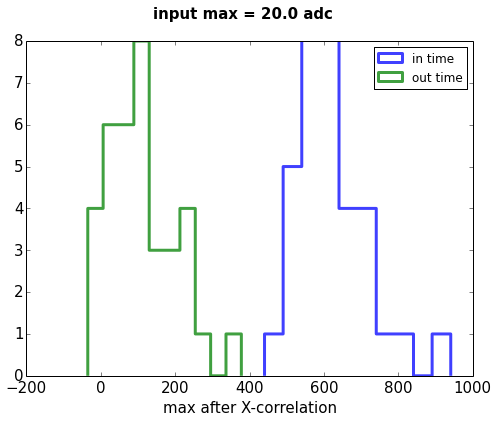

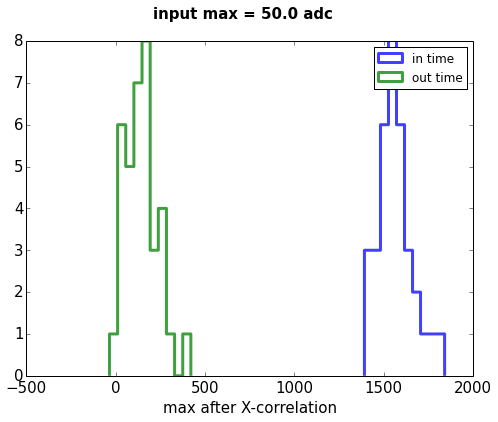

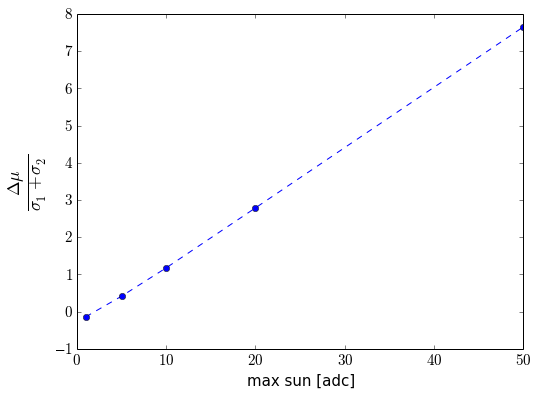

In [346]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
#ndata343 = data343.getnewdatasetcond(np.where( (data343.humLL < 30) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#maxadc1 = np.array([1.,5.,10.,20.,50.])
maxadc1 = np.array([1.,5.,10.,20.,50.,])
typeofbl = 'combine'
#typeofbl = 'random'

statdistance =np.array([])
#for f in fakebl[1::10]:
window = 10 # bins
tofmax = 17
sigma = 2
for maxg in maxadc1:
    maxofcorr = np.array([])
    secondmaxofcorr = np.array([])
    tmaxofcorr = np.array([])
    maxintime = np.array([])
    maxintime2 = []
    maxouttime = np.array([])

    fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
    fig = plt.figure(figsize=(8,6))
    ax1 = plt.subplot()
    plt.suptitle('input max = ' + str(maxg) + ' adc',fontsize=15,fontweight='bold')
    tot = []
    
    for f1 in fakebl1:
        tmax= 24
        tmin = 0
        t = np.linspace(tmin,tmax,len(f1))
        g = utils.gauss(t,1,tofmax,sigma)
        gideal = utils.gauss(t,maxg,tofmax,sigma)
        mf1 = utils.matchedfilter(f1,g)
        mfideal = utils.matchedfilter(gideal,g)
        tofmax = 17
        leftside =  int( (float((tmax - tofmax))/(tmax-tmin)) * len(t) )
        rightside = int( (float((tofmax - tmin))/(tmax-tmin)) * len(t) )
        tm = utils.getxforconv(t,len(mf1))
        nmf1 =mf1[leftside:len(mf1) - rightside]
        nt = np.linspace(0,24,len(nmf1))
        maxofcorr = np.append(maxofcorr,np.max(nmf1))
        tmaxofcorr = np.append(tmaxofcorr,nt[np.argmax(nmf1)])
        intime = nmf1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
#        outtime = nmf1[ (nt < tofmax-sigma) | (nt > tofmax + sigma )] 
        outtime = nmf1[ (nt > 0) & (nt < 10)] 
        mintime =np.max(intime)
        mouttime =np.max(outtime)
        maxintime = np.append(maxintime,mintime)
        maxouttime = np.append(maxouttime,mouttime)
        maxideal = np.max(mfideal)

    n0, bins0, patches0 = plt.hist(maxintime, 10, histtype='step', lw=3, alpha=0.75,log=False,label='in time')
    n1, bins1, patches1 = plt.hist(maxouttime, 10, histtype='step', lw=3, alpha=0.75,log=False,label='out time')
    plt.xlabel('max after X-correlation')
    dist = (np.mean(maxintime) - np.mean(maxouttime)) / (np.std(maxouttime)+ np.std(maxintime))
    statdistance = np.append(statdistance,dist)
    plt.legend()

fig1 = plt.figure(figsize=(8,6))
#import matplotlib
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['text.latex.unicode'] = True
plt.plot(maxadc1,statdistance,'o--')
plt.xlabel('max sun [adc]')
#plt.ylabel(r'$\frac{a}{b}$')
plt.ylabel(r'$\frac{\Delta \mu}{\sigma_1 + \sigma_2}$',fontsize=25)
matplotlib.rcParams['text.usetex'] = False
matplotlib.rcParams['text.latex.unicode'] = False

### algo optimization:

Here we need to look if we can get a better separation if we optimize the sliding window 

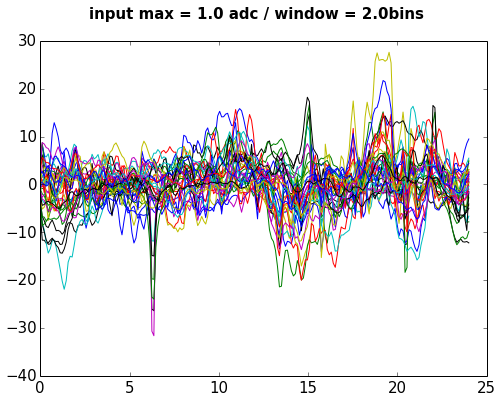

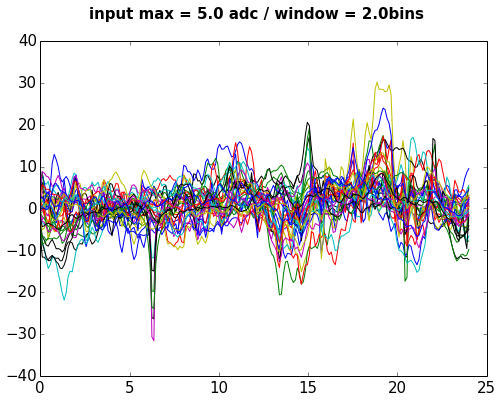

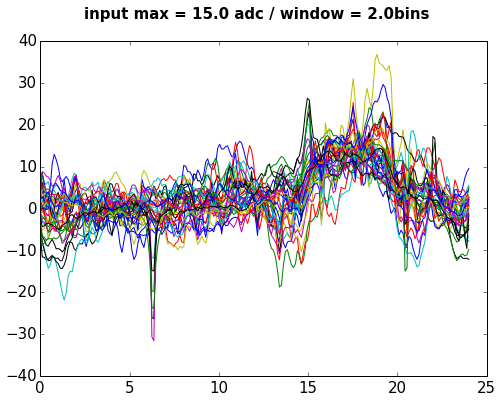

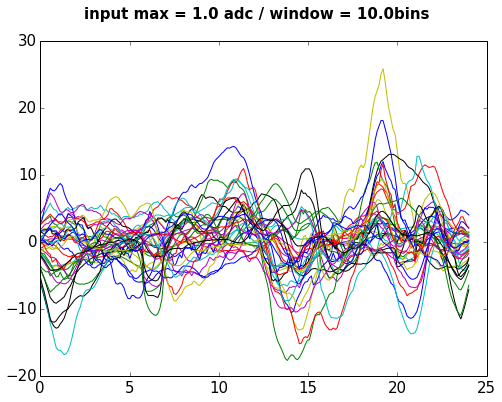

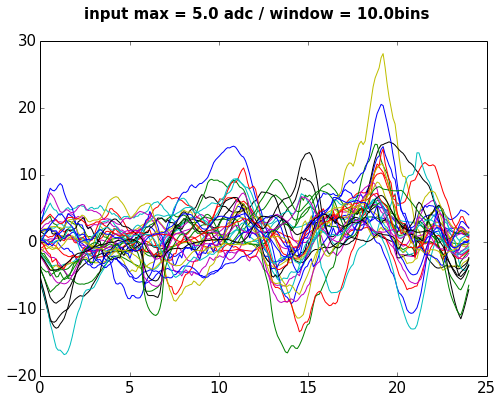

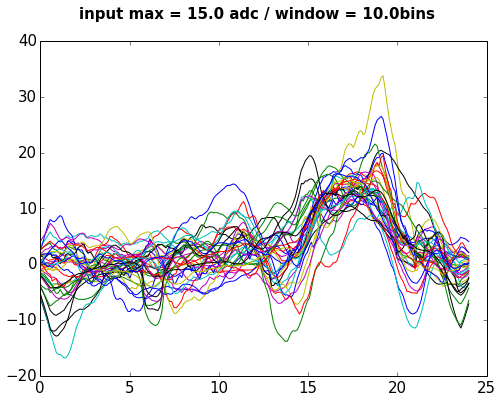

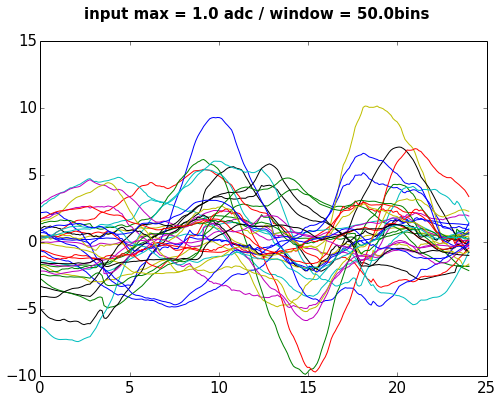

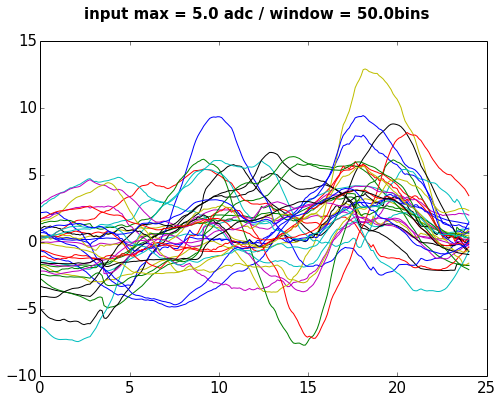

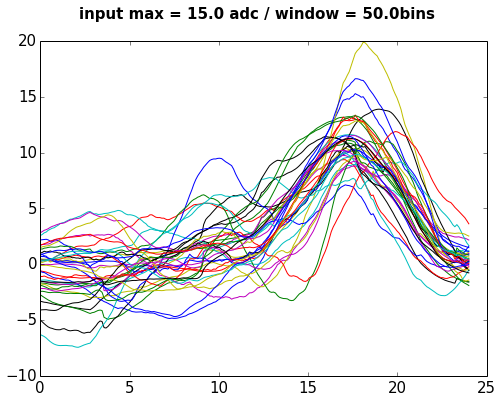

In [383]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = np.array([1.,5.,15])
#maxadc1 = np.array([1.,5.,10.,20.,50.,])
#maxadc1 = np.arange(1,20,2)
typeofbl = 'combine'
#typeofbl = 'random'


#for f in fakebl[1::10]:
#window = [2,5,10,20,50] # bins
window = [2.,10.,50.] # bins
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
for w in window:
    statdistance =np.array([])
    for maxg in maxadc1:
        fig1 = plt.figure(figsize=(8,6))
        plt.suptitle('input max = ' + str(maxg) + ' adc' + ' / window = '+ str(w) + 'bins',fontsize=15,fontweight='bold')
        maxintime = np.array([])
        maxouttime = np.array([])
        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1:
            tmax= 24
            tmin = 0
            sf1 = utils.slidingwindow(f1,w)
            t = np.linspace(tmin,tmax,len(f1))
            t = utils.getxforconv(t,len(sf1))
            plt.plot(t,sf1)

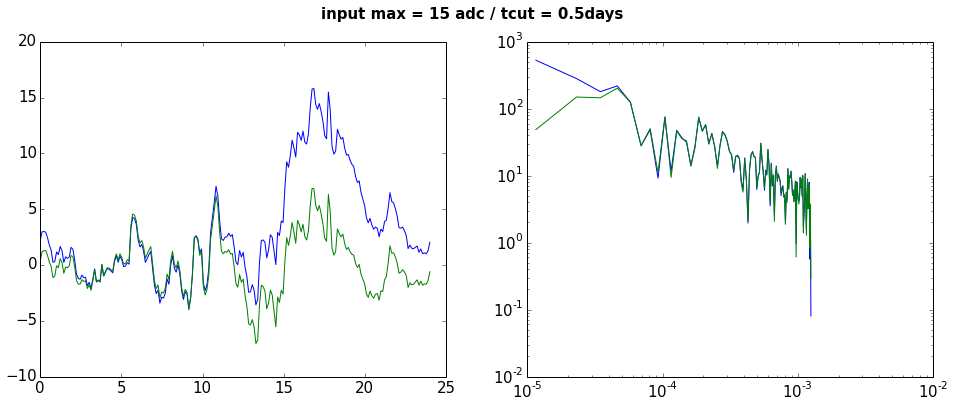

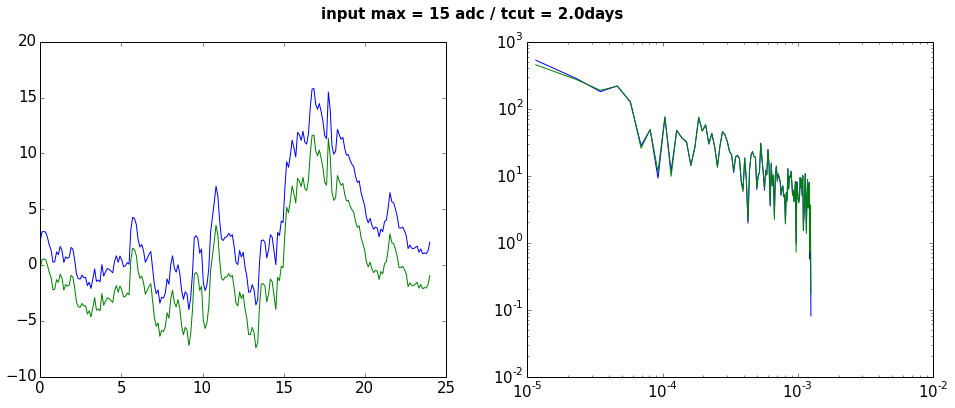

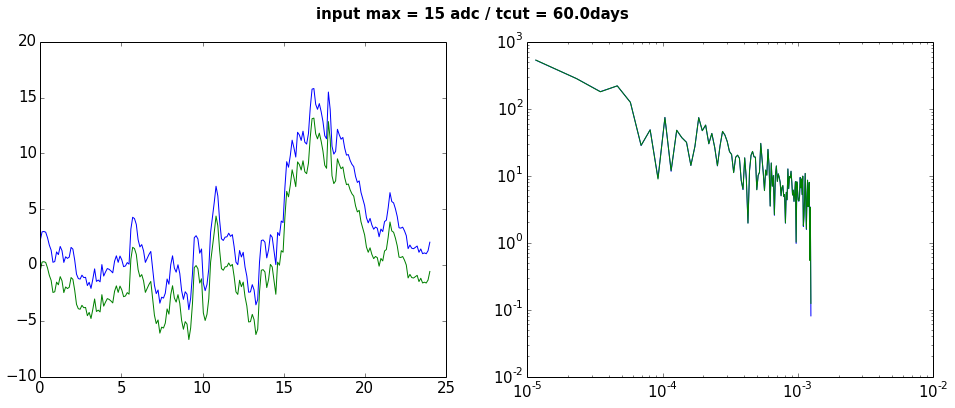

In [415]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#maxadc1 = np.array([1.,5.,15])
maxadc1 = np.array([15])


#maxadc1 = np.array([1.,5.,10.,20.,50.,])
#maxadc1 = np.arange(1,20,2)
typeofbl = 'combine'
#typeofbl = 'random'

#for f in fakebl[1::10]:
#window = [2,5,10,20,50] # bins
tcut = np.array([0.5,2,60]) # in days
#fcut = 1./(tcut*24*3600)
deltat = 400 # second
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
for tc in tcut:
    fc = 1./(tc*24*3600)
    statdistance =np.array([])
    for maxg in maxadc1:
        fig1 = plt.figure(figsize=(16,6))
        ax1 = plt.subplot(121)
        ax2 = plt.subplot(122)
        plt.suptitle('input max = ' + str(maxg) + ' adc' + ' / tcut = '+ str(tc) + 'days',fontsize=15,fontweight='bold')
        maxintime = np.array([])
        maxouttime = np.array([])
        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1[:1]:
            tmax= 24
            tmin = 0
            sf1 = utils.slidingwindow(f1,w)
            ff1 = utils.highpass(f1,1./(deltat),2,fc)
            t = np.linspace(tmin,tmax,len(f1))
#            t = utils.getxforconv(t,len(sf1))
         #   plt.plot(t,f1)
            ax1.plot(t,f1)
            ax1.plot(t,ff1)
            freq = np.fft.rfftfreq(len(t),deltat)
            ffft = np.fft.rfft(ff1)            
            fft = np.fft.rfft(f1)            
            ax2.loglog(freq,np.absolute(fft))
            ax2.loglog(freq,np.absolute(ffft))

- Test on the HP filter

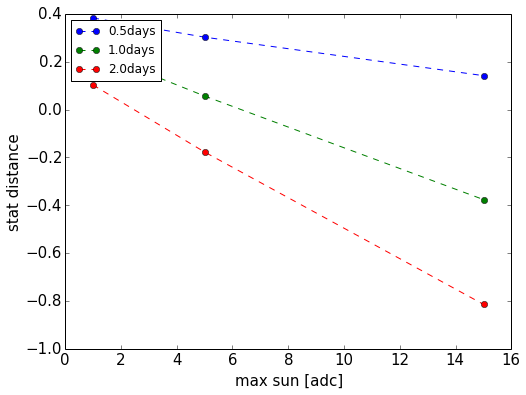

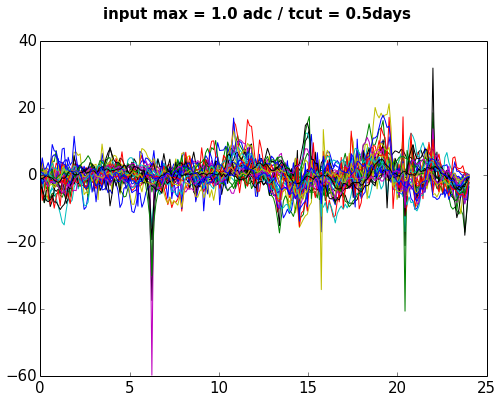

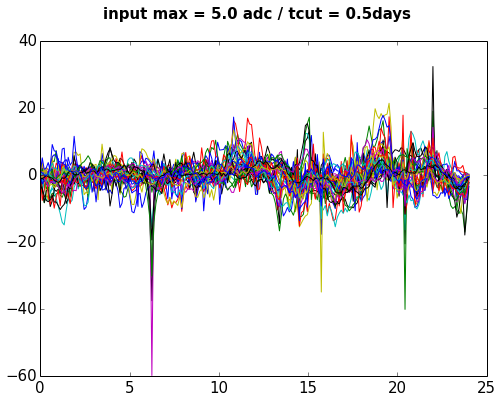

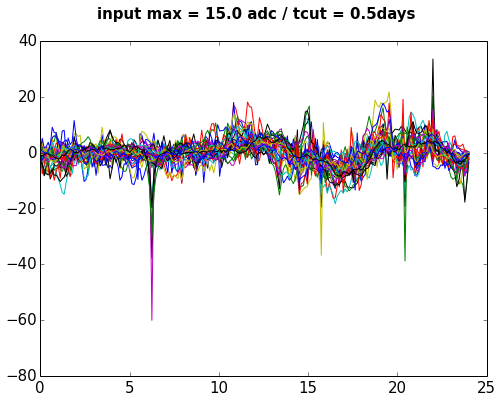

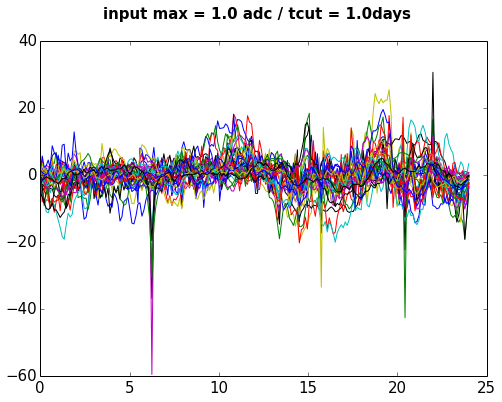

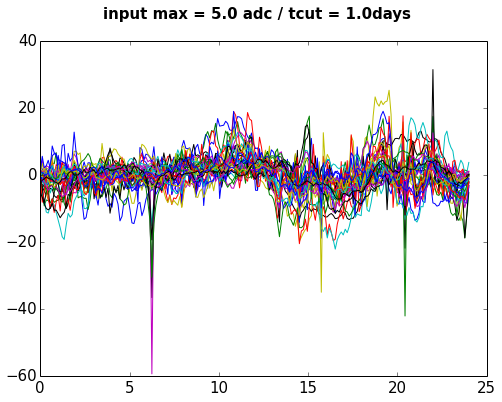

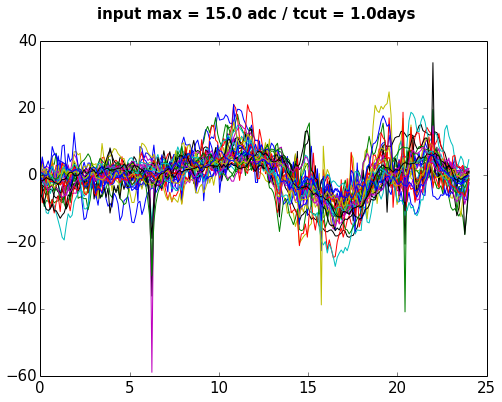

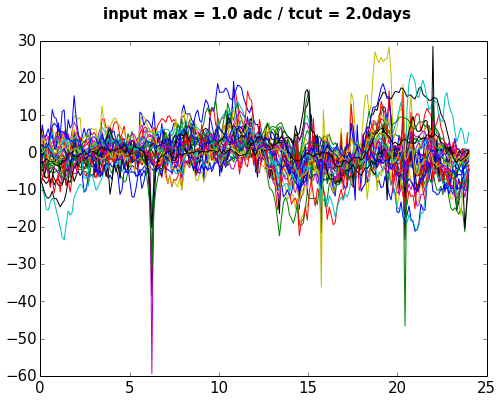

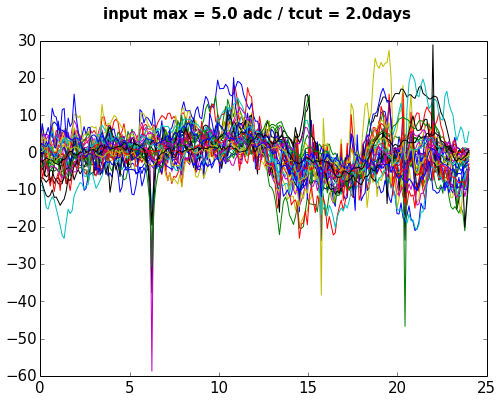

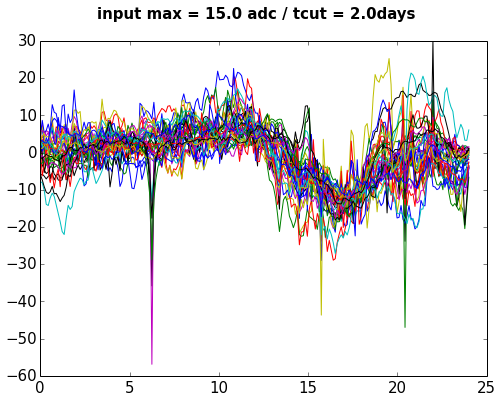

In [536]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

maxadc1 = np.array([1.,5.,15])
#maxadc1 = np.array([15])


#maxadc1 = np.array([1.,5.,10.,20.,50.,])
#maxadc1 = np.arange(1,20,2)
typeofbl = 'combine'
#typeofbl = 'random'

#for f in fakebl[1::10]:
#window = [2,5,10,20,50] # bins
tcut = np.array([0.5,1,2]) # in days
#fcut = 1./(tcut*24*3600)
deltat = 400 # second
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
plt.legend()
ax = plt.subplot(111)
for tc in tcut:
    fc = 1./(tc*24*3600)
    statdistance =np.array([])
    for maxg in maxadc1:
        fig = plt.figure(figsize=(8,6))
        ax1 = plt.subplot(111)
#        ax2 = plt.subplot(122)
        plt.suptitle('input max = ' + str(maxg) + ' adc' + ' / tcut = '+ str(tc) + 'days',fontsize=15,fontweight='bold')
        maxintime = np.array([])
        maxouttime = np.array([])
        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1:
            tmax= 24
            tmin = 0
            nomfc = 1./(1.5*24*3600)
            ff1 = utils.highpass(f1,1./(deltat),2,nomfc)
            ff1 = utils.highpass(f1,1./(deltat),2,fc)
            t = np.linspace(tmin,tmax,len(f1))
            intime = ff1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
            outtime = ff1[ (nt > 0) & (nt < 10)] 
            mintime =np.max(intime)
            mouttime =np.max(outtime)
            maxintime = np.append(maxintime,mintime)
            maxouttime = np.append(maxouttime,mouttime)
#            ax1.plot(t,f1)
            ax1.plot(t,ff1)
            freq = np.fft.rfftfreq(len(t),deltat)
            ffft = np.fft.rfft(ff1)            
            fft = np.fft.rfft(f1)            
        statdist = (np.mean(maxintime) - np.mean(maxouttime) )/(np.std(maxintime) + np.std(maxouttime))
#        print statdist
        statdistance = np.append(statdistance,statdist)
    pdist = ax.plot(maxadc1,statdistance,'o--',label=str(tc) + 'days')
    ax.legend(loc=2)
    
    ax.set_xlabel('max sun [adc]')
    ax.set_ylabel('stat distance')
##matplotlib.rcParams['text.usetex'] = True
#matplotlib.rcParams['text.latex.unicode'] = True
  #  ax.set_ylabel(r'$\frac{\Delta \mu}{\sigma_1 + \sigma_2}$',fontsize=25)
#matplotlib.rcParams['text.usetex'] = False
#matplotlib.rcParams['text.latex.unicode'] = False

[ 0.38355334  0.3626197   0.3421925   0.32221335  0.30314778  0.28459929
  0.2671205   0.25044556  0.23383515  0.21812054  0.20258218  0.18729892
  0.17210723  0.15707199  0.14214655  0.12724087  0.11265611  0.09818802
  0.08383736]
[ 0.24368105  0.19657865  0.14948091  0.1026754   0.05705074  0.01249461
 -0.03195022 -0.07601924 -0.11956327 -0.16312705 -0.2067877  -0.24987437
 -0.29191887 -0.33399164 -0.37608831 -0.41793236 -0.45912481 -0.50076345
 -0.54308441]
[ 0.10329636  0.03126318 -0.03977944 -0.10963446 -0.17715756 -0.24327998
 -0.30920692 -0.37454383 -0.43899687 -0.50259788 -0.56609406 -0.62900551
 -0.6916911  -0.75370287 -0.81439182 -0.87463784 -0.93437941 -0.99368277
 -1.05248936]


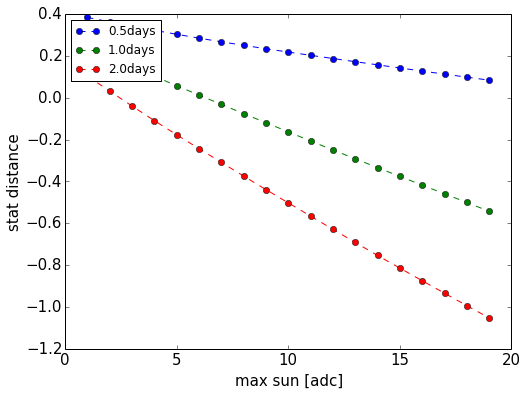

In [540]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#maxadc1 = np.array([1.,5.,15])
#maxadc1 = np.array([15])
#maxadc1 = np.array([1.,5.,10.,20.,50.,])
maxadc1 = np.arange(1,20,1)
typeofbl = 'combine'
#typeofbl = 'random'

#for f in fakebl[1::10]:
#window = [2,5,10,20,50] # bins
tcut = np.array([0.5,1,2]) # in days
#fcut = 1./(tcut*24*3600)
deltat = 400 # second
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
plt.legend()
ax = plt.subplot(111)
nomstatdistance =np.array([])


for tc in tcut:
    fc = 1./(tc*24*3600)
    statdistance =np.array([])
    for maxg in maxadc1:
        maxintime = np.array([])
        maxouttime = np.array([])
        nommaxintime = np.array([])
        nommaxouttime = np.array([])

        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1:
            tmax= 24
            tmin = 0
            nomfc = 1./(1.5*24*3600)
            ff1 = utils.highpass(f1,1./(deltat),2,nomfc)
            ff1 = utils.highpass(f1,1./(deltat),2,fc)
            t = np.linspace(tmin,tmax,len(f1))
            intime = ff1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
            outtime = ff1[ (nt > 0) & (nt < 10)] 
            mintime =np.max(intime)
            mouttime =np.max(outtime)
            maxintime = np.append(maxintime,mintime)
            maxouttime = np.append(maxouttime,mouttime)
#            if first == True:
#                nomintime = f1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
#                nomouttime = f1[ (nt > 0) & (nt < 10)] 
#                nommintime = np.max(nomintime)
#                nommouttime = np.max(nomouttime)
#                first = False

            #            ax1.plot(t,f1)
#            ax1.plot(t,ff1)
            freq = np.fft.rfftfreq(len(t),deltat)
            ffft = np.fft.rfft(ff1)            
            fft = np.fft.rfft(f1)            
        statdist = (np.mean(maxintime) - np.mean(maxouttime) )/(np.std(maxintime) + np.std(maxouttime))
#        print statdist
        statdistance = np.append(statdistance,statdist)
    print statdistance
    pdist = ax.plot(maxadc1,statdistance,'o--',label=str(tc) + 'days')
    ax.legend(loc=2)
    
    ax.set_xlabel('max sun [adc]')
    ax.set_ylabel('stat distance')

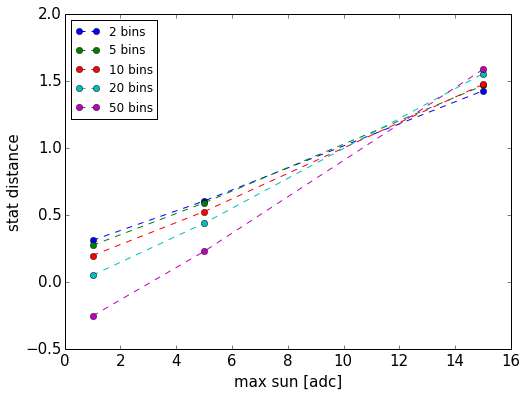

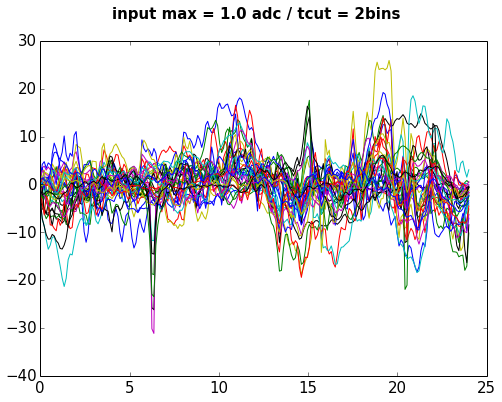

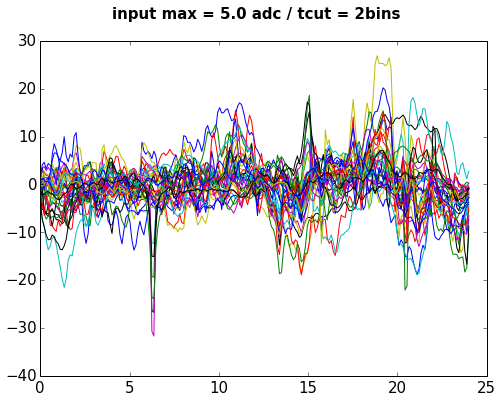

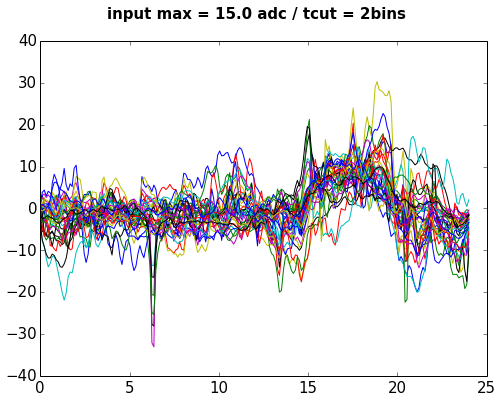

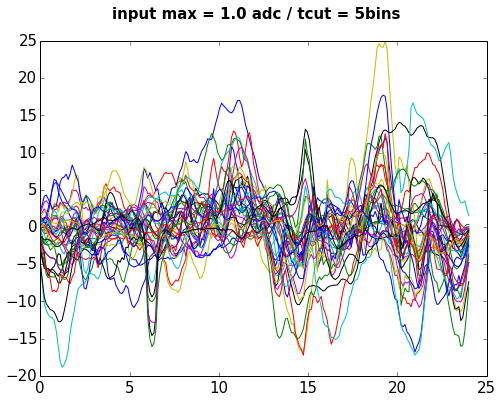

...

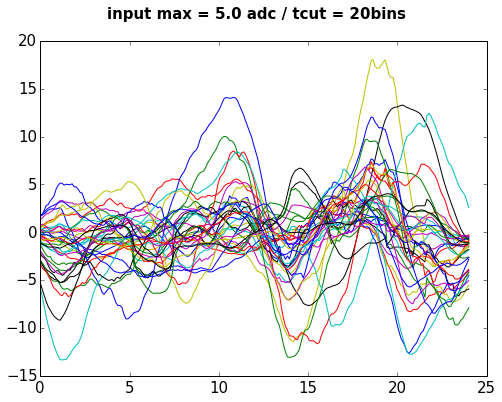

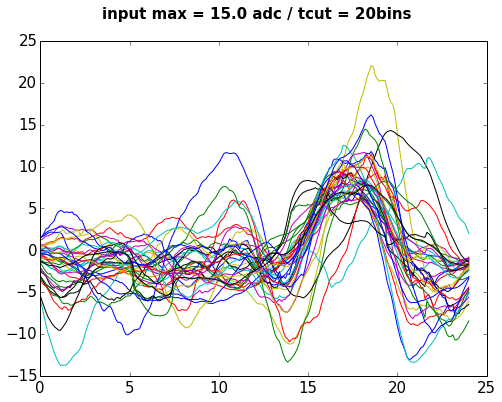

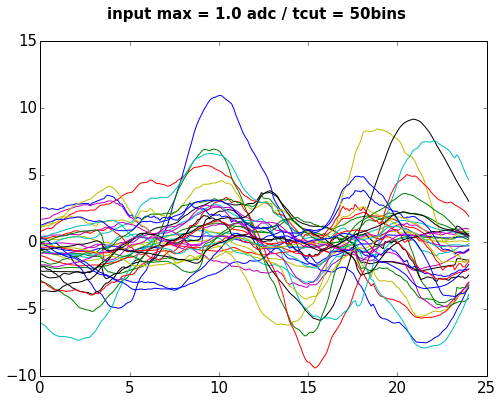

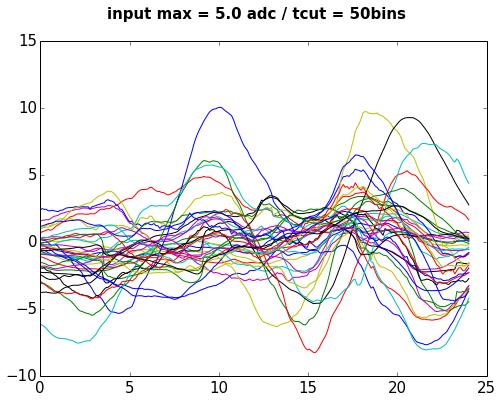

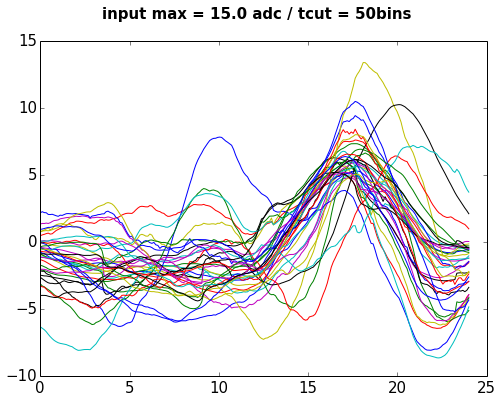

In [451]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#maxadc1 = np.array([1.,5.,15.])
maxadc1 = np.arange(1,15,1)
typeofbl = 'combine'

window = [2,5,10,20,50] # bins
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
plt.legend()
ax = plt.subplot(111)
for w in window:
    statdistance =np.array([])
    for maxg in maxadc1:
        fig = plt.figure(figsize=(8,6))
        ax1 = plt.subplot(111)
        plt.suptitle('input max = ' + str(maxg) + ' adc' + ' / tcut = '+ str(w) + 'bins',fontsize=15,fontweight='bold')
        maxintime = np.array([])
        maxouttime = np.array([])
        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1:
            tmax= 24
            tmin = 0
            nomfc = 1./(1.5*24*3600)
            deltat = 400
            ff1 = utils.highpass(f1,1./(deltat),2,nomfc)
            sf1 = utils.slidingwindow(ff1,w)
            t = np.linspace(tmin,tmax,len(f1))
            intime = sf1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
            outtime = sf1[ (nt > 0) & (nt < 10)] 
            mintime =np.max(intime)
            mouttime =np.max(outtime)
            maxintime = np.append(maxintime,mintime)
            maxouttime = np.append(maxouttime,mouttime)
            ax1.plot(t,sf1)
            freq = np.fft.rfftfreq(len(t),deltat)
            ffft = np.fft.rfft(sf1)            
            fft = np.fft.rfft(f1)            
        statdist = (np.mean(maxintime) - np.mean(maxouttime) )/(np.std(maxintime) + np.std(maxouttime))
        statdistance = np.append(statdistance,statdist)
    pdist = ax.plot(maxadc1,statdistance,'o--',label=str(w) + ' bins')
    ax.legend(loc=2)
    
    ax.set_xlabel('max sun [adc]')
    ax.set_ylabel('stat distance')

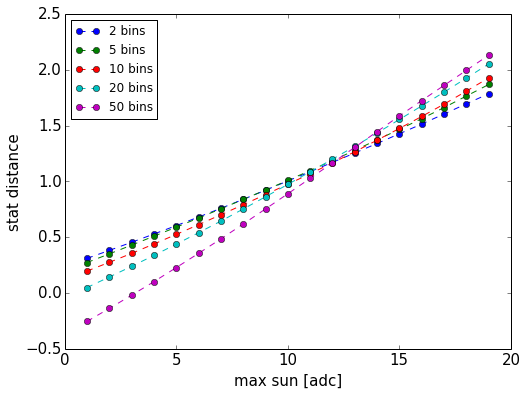

In [453]:
#select the "non sun" periods:
ndata343 = data343.getnewdatasetcond(np.where( (data343.period == 1) & (data343.humLL < 50) ) )
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)

#maxadc1 = np.array([1.,5.,15.])
maxadc1 = np.arange(1,20,1)
typeofbl = 'combine'

window = [2,5,10,20,50] # bins
tofmax = 17
sigma = 2
fig1 = plt.figure(figsize=(8,6))
plt.legend()
ax = plt.subplot(111)
for w in window:
    statdistance =np.array([])
    for maxg in maxadc1:
        maxintime = np.array([])
        maxouttime = np.array([])
        fakebl1 = ndata343.getfakedailybaseline(typeofbl,maxg)
        tot = []
        for f1 in fakebl1:
            tmax= 24
            tmin = 0
            nomfc = 1./(1.5*24*3600)
            deltat = 400
            ff1 = utils.highpass(f1,1./(deltat),2,nomfc)
            sf1 = utils.slidingwindow(ff1,w)
            t = np.linspace(tmin,tmax,len(f1))
            intime = sf1[ (nt > tofmax-sigma) & (nt < tofmax + sigma )] 
            outtime = sf1[ (nt > 0) & (nt < 10)] 
            mintime =np.max(intime)
            mouttime =np.max(outtime)
            maxintime = np.append(maxintime,mintime)
            maxouttime = np.append(maxouttime,mouttime)
            freq = np.fft.rfftfreq(len(t),deltat)
            ffft = np.fft.rfft(sf1)            
            fft = np.fft.rfft(f1)            
        statdist = (np.mean(maxintime) - np.mean(maxouttime) )/(np.std(maxintime) + np.std(maxouttime))
        statdistance = np.append(statdistance,statdist)
    pdist = ax.plot(maxadc1,statdistance,'o--',label=str(w) + ' bins')
    ax.legend(loc=2)
    
    ax.set_xlabel('max sun [adc]')
    ax.set_ylabel('stat distance')

### a look at the data

5


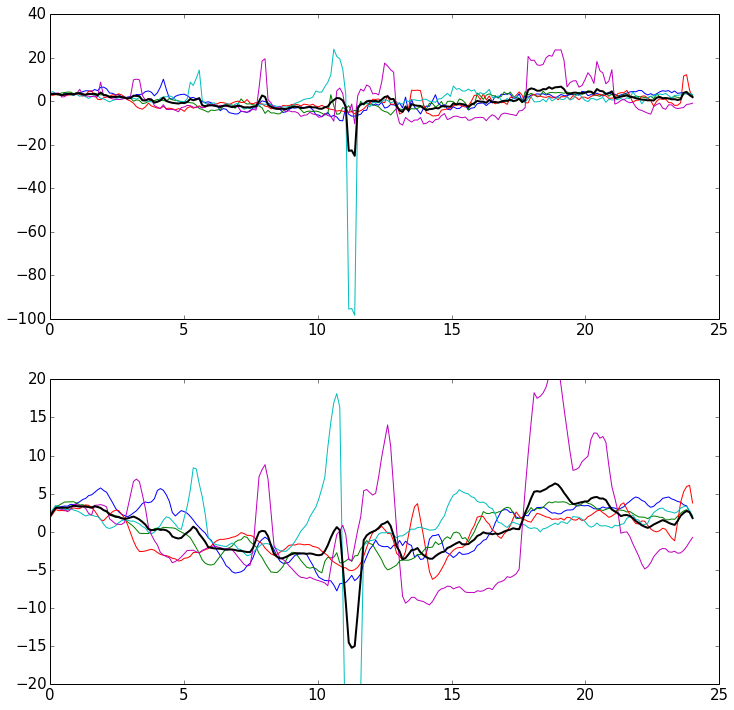

In [559]:
ndata343 = data343.getnewdatasetcond(np.where((data343.humLL < 50) ))
ndata343.filterHP(1.5)
ndata343.tempcorrection(1)
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,12,1))
t1 = utils.datettotimestamp(datetime.datetime(2014,12,28))
ndata343 = ndata343.getnewdataset(t0,t1)
bls = ndata343.gettruedailybaseline()
print len(bls)
tot = []
stot = []
fig = plt.figure(figsize=(12,12))
ax1 = plt.subplot(211)
ax2 = plt.subplot(212)
window  = 5
for bl in bls:
    t = np.linspace(0,24,len(bl))
    sbl = utils.slidingwindow(bl,window)
    st = np.linspace(0,24,len(sbl))
    tot.append(bl)
    stot.append(sbl)
    ax1.plot(t,bl)
    ax2.plot(st,sbl)

mean = np.mean(tot,axis=0)
smean = np.mean(stot,axis=0)
ax2.set_ylim(-20,20)
#ax1.set_ylim(-20,20)
ax1.plot(t,mean,'k',lw=2)
ax2.plot(st,smean,'k',lw=2)



In [42]:
#load the data for 333
data333 = data.getnewdatawithid(333)
pfile = '/Users/romain/work/Auger/EASIER/LPSC/suntransit/data/period/controlperiod_Tsys_50K_below_2adc.txt'
data333.loadperiod(pfile)                                                                                                                       
data333.selectleafs()

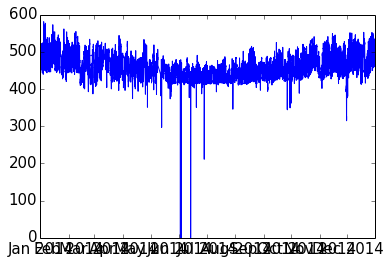

In [43]:
plt.plot(data333.date,data333.radio)

61


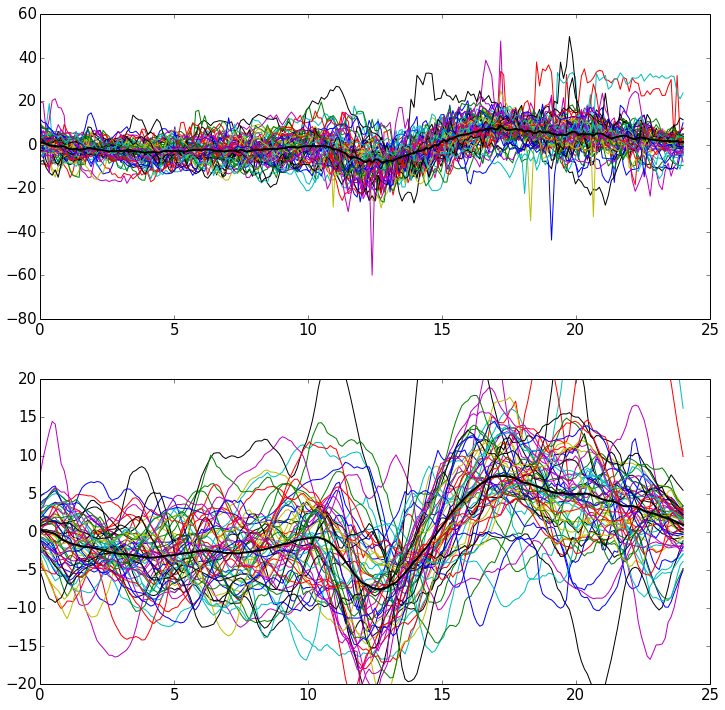

In [44]:
ndata333 = data333.getnewdatasetcond(np.where((data333.humLL < 50) ))
ndata333.filterHP(1.5)
ndata333.tempcorrection(1)
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,1,1))
t1 = utils.datettotimestamp(datetime.datetime(2014,12,28))
ndata333 = ndata333.getnewdataset(t0,t1)
bls = ndata333.gettruedailybaseline()
print len(bls)
tot = []
stot = []
fig = plt.figure(figsize=(12,12))
ax1 = plt.subplot(211)
ax2 = plt.subplot(212)
window  = 10
for bl in bls:
    t = np.linspace(0,24,len(bl))
    sbl = utils.slidingwindow(bl,window)
    st = np.linspace(0,24,len(sbl))
    tot.append(bl)
    stot.append(sbl)
    ax1.plot(t,bl)
    ax2.plot(st,sbl)

mean = np.mean(tot,axis=0)
smean = np.mean(stot,axis=0)
ax2.set_ylim(-20,20)
#ax1.set_ylim(-20,20)
ax1.plot(t,mean,'k',lw=2)
ax2.plot(st,smean,'k',lw=2)



There is definitely a problem with the bump a noon, it is really anoying !

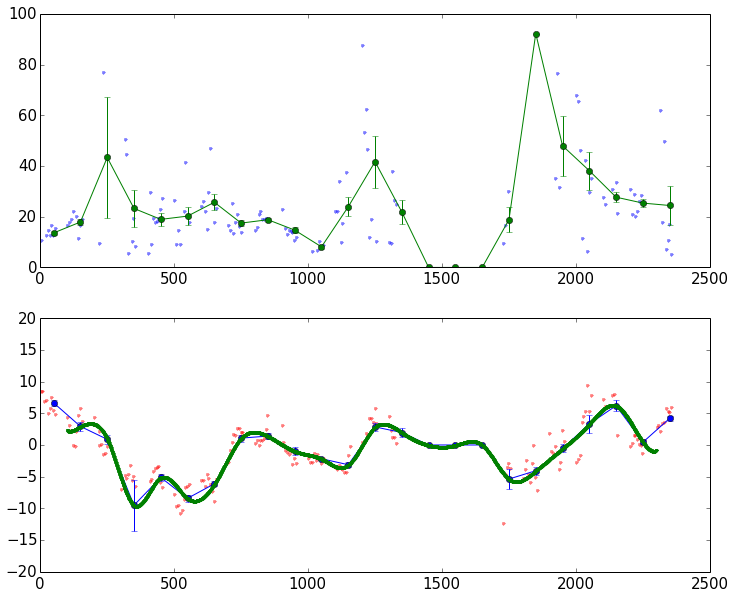

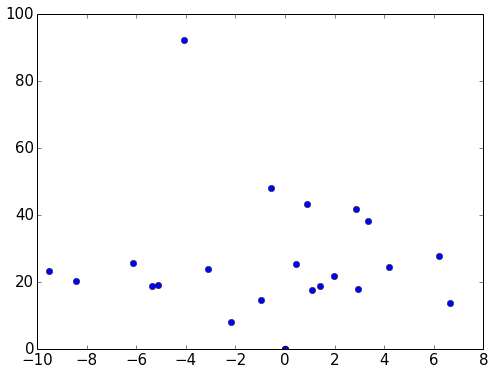

In [178]:
from scipy.interpolate import interp1d
#ndata333 = data333.getnewdatasetcond(np.where((data333.humLL < 50) & (data333.period==1)))
ndata333 = data333.getnewdatasetcond(np.where((data333.humLL < 50)))
ndata333.filterHP(1.5)
ndata333.tempcorrection(1)
import datetime
t0 = utils.datettotimestamp(datetime.datetime(2014,12,20))
t1 = utils.datettotimestamp(datetime.datetime(2014,12,21))
ndata333 = ndata333.getnewdataset(t0,t1)
fig = plt.figure(figsize=(12,10))

ax1 = plt.subplot(211)
absaera = np.absolute(ndata333.aeraE)
#plt.semilogy(ndata333.hhmm,np.absolute(ndata333.aeraE),'.')
limaera = 100
plt.plot(ndata333.hhmm[ (absaera> 5) & (absaera < limaera)] ,absaera[ (absaera> 5) & (absaera < limaera)],'.',alpha=0.5,zorder=-32)
#plt.plot(ndata333.hhmm,ndata333.tempLL,'.',alpha=0.5,zorder=-32)


profa = utils.makeprofile(ndata333.hhmm[ (absaera> 5) & (absaera < limaera)],absaera[ (absaera> 5) & (absaera < limaera)],24,0, 2400)
plt.errorbar(profa[0],profa[1],yerr=profa[3],marker='o',lw=1,label='profile')
#plt.semilogy(ndata333.hhmm,np.absolute(ndata333.tempLL),'.')
#plt.ylim(5,100)
ax2 = plt.subplot(212)
prof = utils.makeprofile(ndata333.hhmm,ndata333.radioc,24,0, 2400)
plt.errorbar(prof[0],prof[1],yerr=prof[3],marker='o',lw=1,label='profile')
f = interp1d(prof[0], prof[1], kind='cubic')
newhhmm = np.linspace(100,2300,2401)
plt.plot(newhhmm,f(newhhmm),'.')
#plt.errorbar(prof[0],prof[1],xerr=prof[2],yerr=prof[3],marker='o',lw=3,label='profile')
plt.plot(ndata333.hhmm,ndata333.radioc,'.',alpha=0.5,zorder=-32)
ax2.set_ylim(-20,20)

fig = plt.figure(figsize=(8,6))
plt.plot(prof[1],profa[1],'o')
#plt.plot(absaera[ (absaera> 5) & (absaera < 100)], ndata333.tempLL[ (absaera> 5) & (absaera < 100)],'.')
#plt.plot( ndata333.tempLL[ (absaera> 5) & (absaera < 100)], absaera[ (absaera> 5) & (absaera < 100)],'.')